# scRNASeq data analysis workflow
In this jupyter  notebook, you  do standard analysis for scRNASeq data which consists of following key steps:  
- **Loading the Data:** 
  - Import raw scRNASeq data into the environment for processing and analysis.  
- **Quality Control:**  
  - Assess the quality of the data by identifying and filtering out low-quality cells (e.g., cells with high mitochondrial content or low gene counts).  
- **Filtering:**
  - Remove cells and genes that do not meet certain quality thresholds, ensuring only relevant data is used for analysis.  
- **Doublet Detection:** 
  - Identify and exclude potential doublets (two cells captured as one) to prevent misleading results.  
- **Cell Cycle Regression:** 
  - Account for cell cycle effects in the data to reduce their impact on downstream analyses, ensuring more accurate clustering.  
- **Feature Selection:**  
  - Identify highly variable genes across cells that are most informative for distinguishing cell states or types.  
- **Data Integration (Batch Correction):** 
  - Combine data from multiple batches or experiments, correcting for technical variations to enable accurate comparisons.  
- **Dimensionality Reduction:**  
  - Reduce the complexity of the data (e.g., using PCA or UMAP) to visualize and analyze patterns in a lower-dimensional space.  
- **Differential Expression:**
  -  Identify genes that are differentially expressed between cell populations, helping to define distinct cell types or states.  



_These materials are primarily derived from the scRNASeq workshop created at NBIS (Åsa Björklund, Paulo Czarnewski, Susanne Reinsbach, Roy Francis). To access the full course content, please visit [here](https://nbisweden.github.io/workshop-scRNAseq/)._  

## Importing packages

In [32]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# single cell analysis
import scanpy as sc 
import scanpy.external as sce 

# Plotting 
import seaborn as sns 
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Integration
import harmonypy as hm 
import bbknn

# Clustering
import leidenalg # Leiden clustering
from sklearn.cluster import KMeans # KMeans clustering
from sklearn.metrics import adjusted_rand_score  # ARI
from sklearn.cluster import AgglomerativeClustering # Agglomerative clustering


import pybiomart # for gene annotation
import warnings
import os # for file handling

import urllib.request

warnings.simplefilter(action='ignore', category=Warning)

We first set the Matplotlib plotting defaults for all plots and print versions of python packages in the current environment.  

In [33]:
sc.settings.set_figure_params(dpi = 90, facecolor='white')
# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3
sc.logging.print_header()


scanpy==1.10.1 anndata==0.10.7 umap==0.5.5 numpy==1.23.4 scipy==1.10.1 pandas==2.2.2 scikit-learn==1.3.1 statsmodels==0.14.2 igraph==0.10.4 pynndescent==0.5.12


## Loading the data
The data is generated by 10x Genomics technology, in this turtorial we use 8 PBMC datasets from four COVID-19 patients and four healthy controls. The data has been subsampled to 1500 cells per sample. 

In [34]:
import os

# download pre-computed annotation
fetch_annotation = False

path_data = "https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq"

path_covid = "./data/covid"
if not os.path.exists(path_covid):
    os.makedirs(path_covid, exist_ok=True)

path_results = "data/covid/results"
if not os.path.exists(path_results):
    os.makedirs(path_results, exist_ok=True)

import urllib.request


file_list = [
    "normal_pbmc_13.h5", "normal_pbmc_14.h5", "normal_pbmc_19.h5", "normal_pbmc_5.h5",
    "ncov_pbmc_15.h5", "ncov_pbmc_16.h5", "ncov_pbmc_17.h5", "ncov_pbmc_1.h5"
]

for i in file_list:
    path_file = os.path.join(path_covid, i)
    if not os.path.exists(path_file):
        file_url = os.path.join(path_data, "covid", i)
        urllib.request.urlretrieve(file_url, path_file)



Let's load the data by `read_10x_h5`.  

In [35]:
data_cov1 = sc.read_10x_h5(os.path.join(path_covid,'ncov_pbmc_1.h5'))
data_cov1.var_names_make_unique()
data_cov15 = sc.read_10x_h5(os.path.join(path_covid,'ncov_pbmc_15.h5'))
data_cov15.var_names_make_unique()
data_cov16 = sc.read_10x_h5(os.path.join(path_covid,'ncov_pbmc_16.h5'))
data_cov16.var_names_make_unique()
data_cov17 = sc.read_10x_h5(os.path.join(path_covid,'ncov_pbmc_17.h5'))
data_cov17.var_names_make_unique()
data_ctrl5 = sc.read_10x_h5(os.path.join(path_covid,'normal_pbmc_5.h5'))
data_ctrl5.var_names_make_unique()
data_ctrl13 = sc.read_10x_h5(os.path.join(path_covid,'normal_pbmc_13.h5'))
data_ctrl13.var_names_make_unique()
data_ctrl14 = sc.read_10x_h5(os.path.join(path_covid,'normal_pbmc_14.h5'))
data_ctrl14.var_names_make_unique()
data_ctrl19 = sc.read_10x_h5(os.path.join(path_covid,'normal_pbmc_19.h5'))
data_ctrl19.var_names_make_unique()

reading ./data/covid/ncov_pbmc_1.h5
 (0:00:00)
reading ./data/covid/ncov_pbmc_15.h5
 (0:00:00)
reading ./data/covid/ncov_pbmc_16.h5
 (0:00:00)
reading ./data/covid/ncov_pbmc_17.h5
 (0:00:00)
reading ./data/covid/normal_pbmc_5.h5
 (0:00:00)
reading ./data/covid/normal_pbmc_13.h5
 (0:00:00)
reading ./data/covid/normal_pbmc_14.h5
 (0:00:00)
reading ./data/covid/normal_pbmc_19.h5
 (0:00:00)


Let's add some metadata.  

In [36]:
# add some metadata
data_cov1.obs['type']="Covid"
data_cov1.obs['sample']="covid_1"
data_cov15.obs['type']="Covid"
data_cov15.obs['sample']="covid_15"
data_cov16.obs['type']="Covid"
data_cov16.obs['sample']="covid_16"
data_cov17.obs['type']="Covid"
data_cov17.obs['sample']="covid_17"
data_ctrl5.obs['type']="Ctrl"
data_ctrl5.obs['sample']="ctrl_5"
data_ctrl13.obs['type']="Ctrl"
data_ctrl13.obs['sample']="ctrl_13"
data_ctrl14.obs['type']="Ctrl"
data_ctrl14.obs['sample']="ctrl_14"
data_ctrl19.obs['type']="Ctrl"
data_ctrl19.obs['sample']="ctrl_19"

We can now merge all the anndata to a single anndata object and remove the individual anndata objects:

In [37]:
# merge into one object.
adata = data_cov1.concatenate(data_cov15, data_cov16, data_cov17, data_ctrl5, data_ctrl13, data_ctrl14, data_ctrl19)

# and delete individual datasets to save space
del(data_cov1, data_cov15, data_cov16, data_cov17)
del(data_ctrl5, data_ctrl13, data_ctrl14, data_ctrl19)

**Question: How many cells and genes are in this dataset?**

Checking the `var` slot which contains gene annotation information.  

In [38]:
adata.var

,gene_ids,feature_types,genome
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38
FAM138A,ENSG00000237613,Gene Expression,GRCh38
OR4F5,ENSG00000186092,Gene Expression,GRCh38
AL627309.1,ENSG00000238009,Gene Expression,GRCh38
AL627309.3,ENSG00000239945,Gene Expression,GRCh38
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,GRCh38
AC233755.1,ENSG00000275063,Gene Expression,GRCh38
AC240274.1,ENSG00000271254,Gene Expression,GRCh38
AC213203.1,ENSG00000277475,Gene Expression,GRCh38


## QC 
Here we can check generate some metrics which helps us to evaluate the quality of the dataset:
- `total_counts`:  Total number of molecules in a cell.  
- `n_genes_by_counts`: Number of genes with at least one count in a cell.  
- `pct_counts_mt`: The percentage of reads mapped to mitochondrial genes.  
- `pct_counts_ribo`: The percentage of reads mapped to ribosomal genes.  
- `pct_counts_hb`: The percentage of reads mapped to hemoglobin genes (blood cells).  

In [39]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-') 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P|E|S)]"))

adata.var

,gene_ids,feature_types,genome,mt,ribo,hb
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,False,False,False
FAM138A,ENSG00000237613,Gene Expression,GRCh38,False,False,False
OR4F5,ENSG00000186092,Gene Expression,GRCh38,False,False,False
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,False,False
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,False,False,False
...,...,...,...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,GRCh38,False,False,False
AC233755.1,ENSG00000275063,Gene Expression,GRCh38,False,False,False
AC240274.1,ENSG00000271254,Gene Expression,GRCh38,False,False,False
AC213203.1,ENSG00000277475,Gene Expression,GRCh38,False,False,False


Now we calculate some QC metrics, such as percentage of mitochondrial genes. 

In [40]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)
adata

AnnData object with n_obs × n_vars = 12000 × 33538
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

Now we plot the QC metrics.  

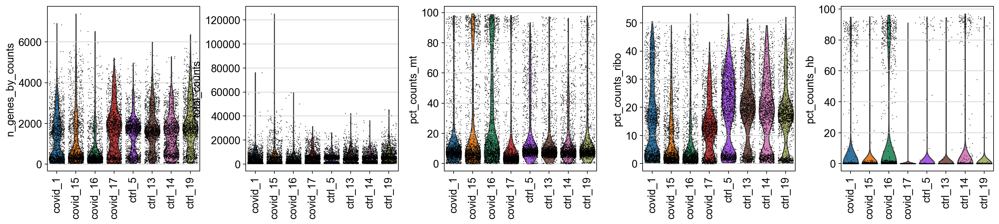

In [41]:
sc.pl.violin(adata, 
             ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 90,
             multi_panel=False)

Samples `covid_15 & covid_16` show distinct behaviour: fewer detected genes and more mitochondrial genes.  

 In addition to above metrics we can plot `total_counts` vs ` n_genes_by_count` in a scatterplot.  

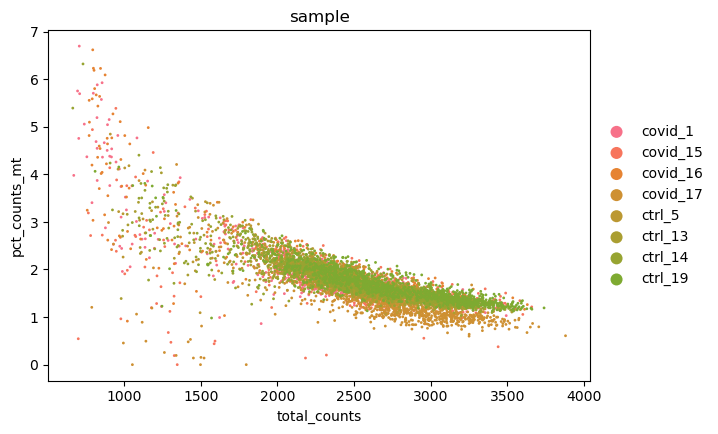

In [31]:
sc.pl.scatter(adata, x = 'total_counts', y = 'pct_counts_mt', color = 'sample')

## Filtering

For downstream analysis, it is important to remove noise from the dataset. In this case we can remove cells with few number of detected genes, and thus we keep cells with at least **200** detected genes. Also to have enough statistical power we need to have enough observation for given genes and thus we keep genes that are expressed in at least **three** cells. 

In [ ]:
sc.pp.filter_cells(adata,min_genes = 200)
sc.pp.filter_genes(adata,min_cells = 3)

filtered out 1336 cells that have less than 200 genes expressed
filtered out 14047 genes that are detected in less than 3 cells


Isn't it surprising that many genes have been filtered?

We can also plot highly expressed genes using `scanpy.pl.highest_expr_genes` methods.

normalizing counts per cell
    finished (0:00:00)


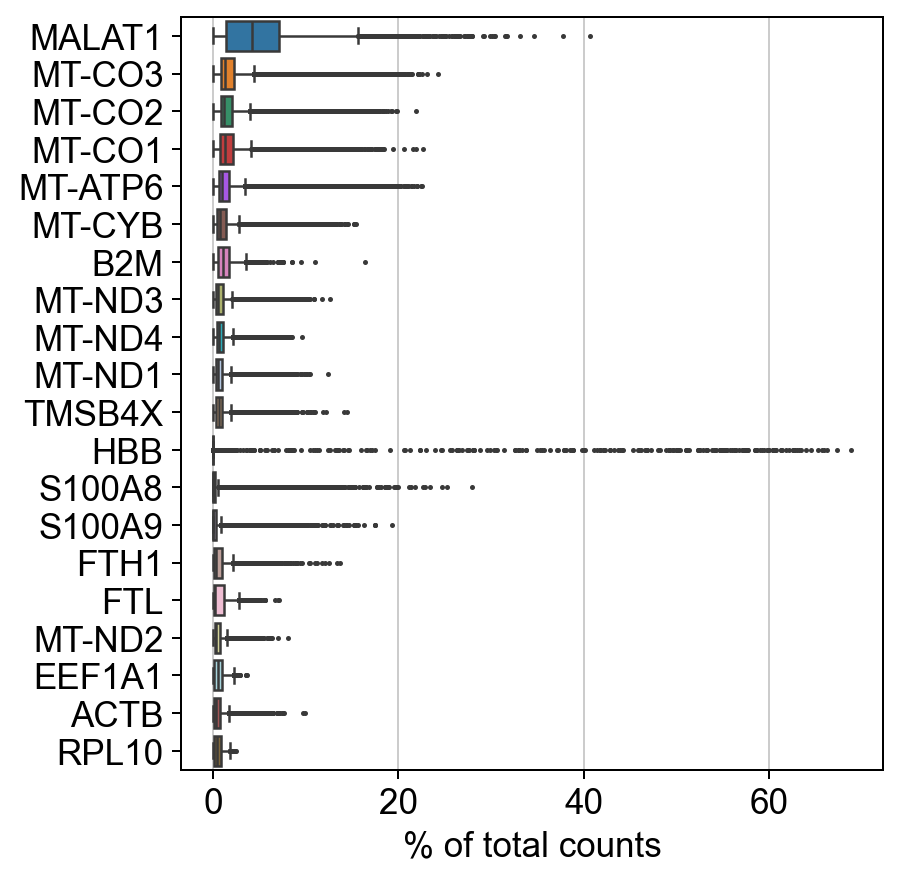

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=20)

_MALAT1_ shows highest expression in this dataset together with mitochondrial genes. _MALAT1_ is a nuclear lincRNA and its high expression may not be surprising, because it is frequently detected in poly-A captured scRNASeq data. In other word, it may be technical issue. Regarding mitochondrial/ribosomal genes, we can filter cells with high expression of these genes. High expression of mitochondrial gene may be indicative of high mortality of cells. 

This dataset does not show very high fraction though and by considering `20%` threshold for mitochondrial we will have reasonable number of cells to do downstream analysis. 

High fraction of ribosomal genes may also indicate low-quality cells. In this dataset the fraction is not high and we can be less stringent by applying a cut-off of `5%`.   

In [ ]:
adata = adata[adata.obs['pct_counts_mt'] < 20, :]
adata = adata[adata.obs['pct_counts_ribo'] > 5, :]

print("Remaining cells", adata.n_obs)


Remaining cells 7431


Let's look at the data after filtering.  

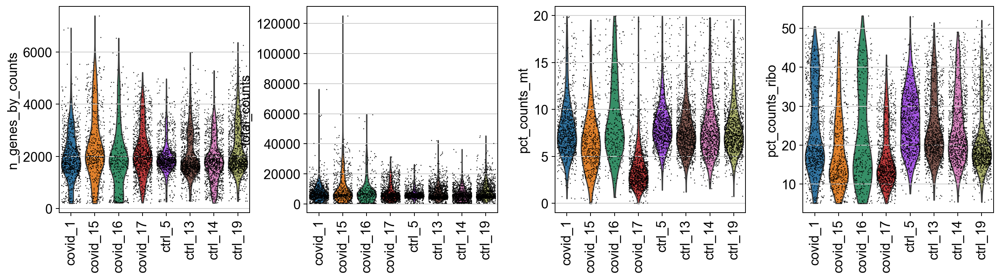

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, groupby = 'sample', rotation= 90, multi_panel=False)

## Samples Sex

The sex of the samples is crucial metadata that should be taken into account in the analysis to control for any sex-associated effects. Moreover, inferring the sex of samples using sequencing data can be a good sanity check for potential mislabelling and so on. By evaluating mapping to following features we can determine the sex:  
- X-inactive specific transcript (_XIST_).  
- Y chromosome.  


We can extract the information of these features from annotation file (gtf) or using Biomart in Ensembl. In python (`pybiomart`) you can also directly connect to ensembl database and extract annotation information.    

For gtf format you can read [here](https://nbisweden.github.io/workshop-RNAseq/2403/lab_download.html) (from RNASeq workshop organized by NBIS)

In [ ]:
if not fetch_annotation:
    annot = sc.queries.biomart_annotations("hsapiens", ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"], ).set_index("external_gene_name")
    # adata.var[annot.columns] = annot

annot

,ensembl_gene_id,start_position,end_position,chromosome_name
external_gene_name,,,,
MT-TF,ENSG00000210049,577,647,MT
MT-RNR1,ENSG00000211459,648,1601,MT
MT-TV,ENSG00000210077,1602,1670,MT
MT-RNR2,ENSG00000210082,1671,3229,MT
MT-TL1,ENSG00000209082,3230,3304,MT
...,...,...,...,...
LINC01705,ENSG00000232679,221819842,222064773,1
RNU6-403P,ENSG00000200033,221837334,221837437,1
LINC02474,ENSG00000228437,221966341,221984964,1


With the information of the features we can now extract fraction of reads that mapped to chromosome Y:

In [ ]:
chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

adata.obs['percent_chrY'] = np.sum(
    adata[:, chrY_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1 * 100

We can directly extract the expression of _XIST_ from `anndata`  object.  

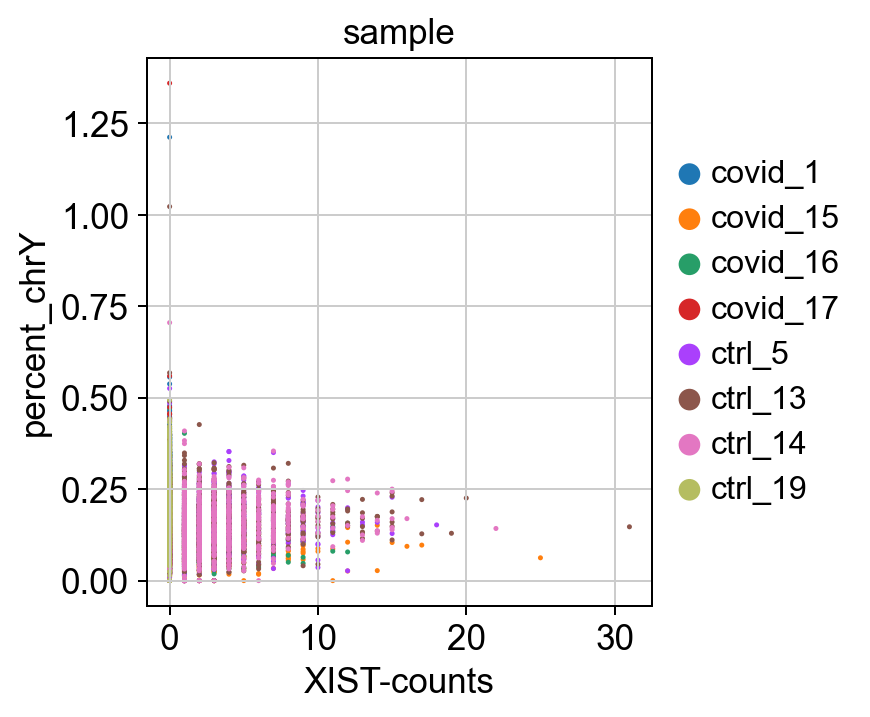

In [ ]:
# color inputs must be from either .obs or .var, so add in XIST expression to obs.
adata.obs["XIST-counts"] = adata.X[:,adata.var_names.str.match('XIST')].toarray()

sc.pl.scatter(adata, x='XIST-counts', y='percent_chrY', color="sample")

Now we can plot _XIST_ expression for all the samples 

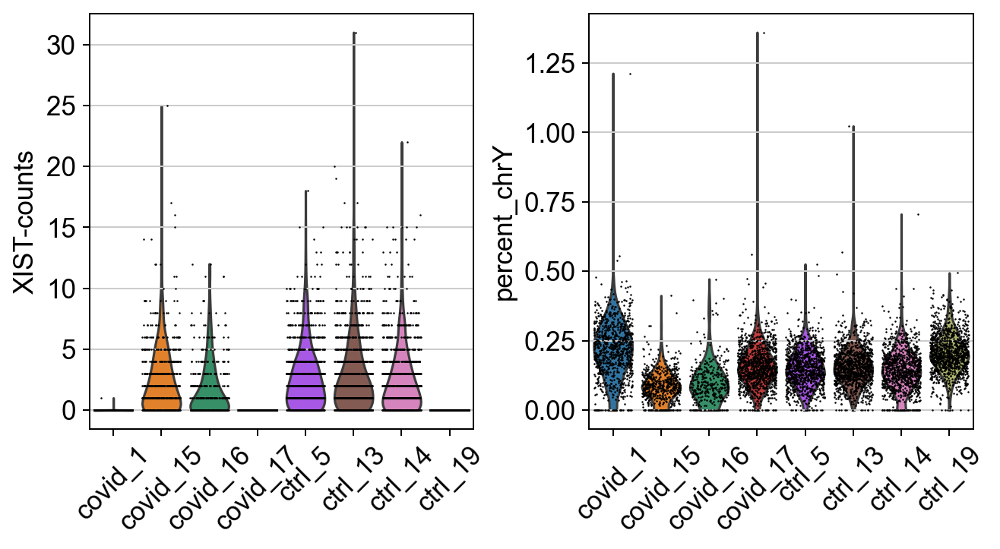

In [ ]:
sc.pl.violin(adata, ["XIST-counts", "percent_chrY"], jitter=0.4, groupby = 'sample', rotation= 45)
# Saving filtered data
adata.write(os.path.join(path_results, "covid_filtered.h5ad"))

Now, can you see which samples are feamle/male? 

## Doublet detection

Doublets of cells are is a common feature in scRNASeq where cells in the same well/droplet are sequenced together. They are either homotypic (from the same cell type) or heterotypic (from different cell types). Dependent on the technology, there can be an expected proportion of doublets. In 10x technology this proportion is linearly correlated with the number of loaded cells. 

| Multiplet Rate (%) | # of Cells Loaded | # of Cells Recovered |
|--------------------|-------------------|----------------------|
| ~0.4%              | ~870              | ~500                 |
| ~0.8%              | ~1700             | ~1000                |
| ~1.6%              | ~3500             | ~2000                |
| ~2.3%              | ~5300             | ~3000                |
| ~3.1%              | ~7000             | ~4000                |
| ~3.9%              | ~8700             | ~5000                |
| ~4.6%              | ~10500            | ~6000                |
| ~5.4%              | ~12200            | ~7000                |
| ~6.1%              | ~14000            | ~8000                |
| ~6.9%              | ~15700            | ~9000                |
| ~7.6%              | ~17400            | ~10000               |


One of the approaches to detect doublets, is by simulating doublets. Artificial doublets are randomly subsampled in pairs and their gene expression is averaged to obtain doublets counts. The new artifical doublets are projected together with the original cells into a lower dimensional principle space. Then a doublet score based on numnber of artificial doublet neighbors is computed in the k nearest neighbour graph. 

Most such packages need an assumption about the number/proportion of expected doublets in the dataset. The data you are using is subsampled, but the original datasets contained about 5 000 cells per sample, hence we can assume that they loaded about 9 000 cells and should have a doublet rate at about 4%.

`scrublet`  is a tool which is used to identify doublets. This tool works with raw counts saved in `adata.X`.   

**Note: that doublet detection should be done for each sample separately.**   

To do that we will split the data in a loop and run ` scrublet`  for each sample and add the detected doublets to the `adata`  object.     

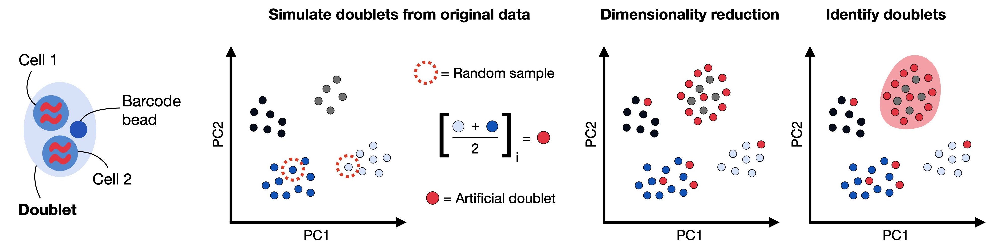

_Artificial doublets are randomly subsampled in pairs and their gene expression is averaged to obtain doublets counts. The new artifical doublets are projected together with the original cells into a lower dimensional principle space. Then a doublet score based on numnber of artificial doublet neighbors is computed in the k nearest neighbour graph._ 

In [ ]:
#!pip install scrublet
import scrublet as scr

# split per batch into new objects.
batches = adata.obs['sample'].cat.categories.tolist()
alldata = {}
for batch in batches:
    tmp = adata[adata.obs['sample'] == batch,]
    print(batch, ":", tmp.shape[0], " cells")
    scrub = scr.Scrublet(tmp.X)
    out = scrub.scrub_doublets(verbose=False, n_prin_comps = 20)
    alldata[batch] = pd.DataFrame({'doublet_score':out[0],'detected_doublets':out[1]},index = tmp.obs.index)
    print(alldata[batch].detected_doublets.sum(), " detected_doublets")

# add predictions to the adata object.
scrub_pred = pd.concat(alldata.values())
adata.obs['doublet_scores'] = scrub_pred['doublet_score'] 
adata.obs['detected_doublets'] = scrub_pred['detected_doublets'] 

print('Total doublets:' , sum(adata.obs['detected_doublets']))

covid_1 : 900  cells
26  detected_doublets
covid_15 : 599  cells
6  detected_doublets
covid_16 : 373  cells
3  detected_doublets
covid_17 : 1101  cells
17  detected_doublets
ctrl_5 : 1052  cells
41  detected_doublets
ctrl_13 : 1173  cells
55  detected_doublets
ctrl_14 : 1063  cells
18  detected_doublets
ctrl_19 : 1170  cells
46  detected_doublets
Total doublets: 212


When two cells are sequenced with one cell barcode, we should expect that there is high number of detected cells under single cell (barcode).

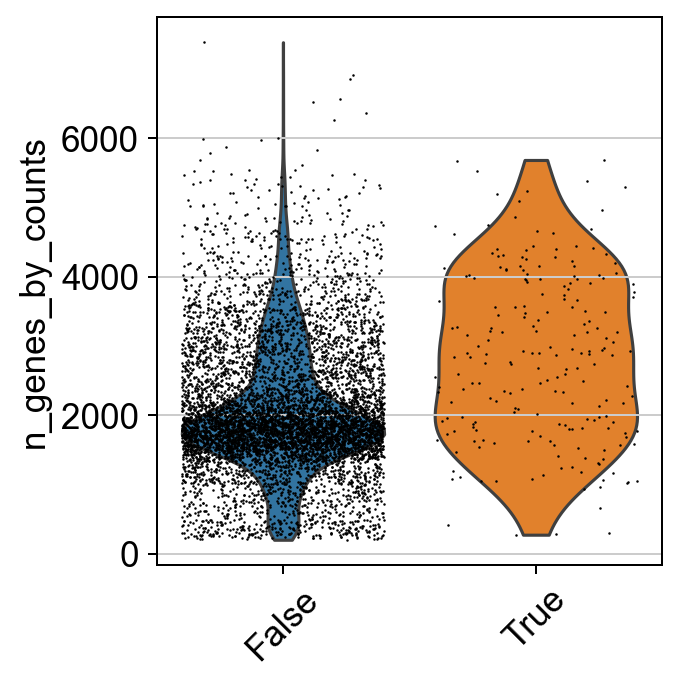

In [ ]:
# add in column with singlet/doublet instead of True/Fals
%matplotlib inline

adata.obs['doublet_info'] = adata.obs["detected_doublets"].astype(str)
sc.pl.violin(adata, 'n_genes_by_counts', jitter=0.4, groupby = 'doublet_info', rotation=45)
adata.write(os.path.join(path_results, "covid_filtered_removed_doublets.h5ad"))

In order to show the distribution of doublets among all the cells, we will do the following step:
- Normalize and scale the data.  
- Dimensionality reduction (you will read further below).  
- Creating UMAP (you will read further below).  

**Note: When you normalize the data the `data`  slot will be overwritten with the normalized counts.**  
In order to have a copy of the raw data you can save it in a new variable (`adata.raw`).  

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
extracting highly variable genes
    finished (0:00:08)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['total_counts', 'pct_counts_mt']
    finished (0:00:27)
computing PCA
    with n_comps=50


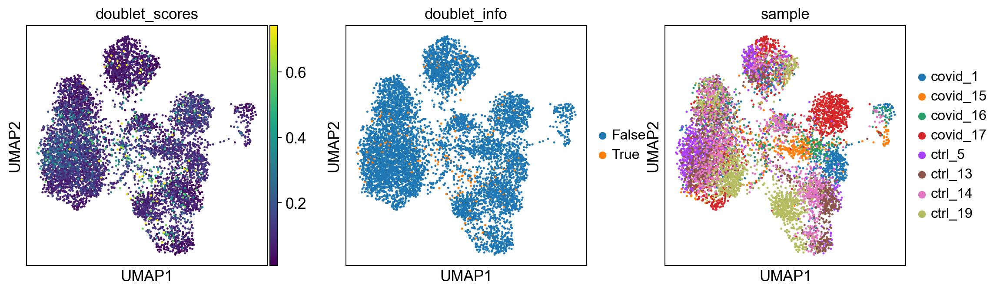

In [ ]:
# save normalized counts in raw slot.
adata.raw = adata
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# normalize to depth 10 000
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adata)

# scale
sc.pp.scale(adata)

# Identifying highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['doublet_scores','doublet_info','sample'])

Now we can remove all the detected doublets

In [ ]:
# also revert back to the raw counts as the main matrix in adata
adata = adata.raw.to_adata() 

adata = adata[adata.obs['doublet_info'] == 'False',:]
print(adata.shape)
#Saving the filtered object
adata.write_h5ad('data/covid/results/covid_filtered_removed_doublets.h5ad')


(7219, 19491)


## Cell cycle state

There are gene markers by which we can score the cell cycle state. The algorithm calculates the difference of mean expression of the given list and the mean expression of reference genes. To build the reference, the function randomly chooses a bunch of genes matching the distribution of the expression of the given list. Cell cycle scoring adds three slots in the metadata, a score for S phase, a score for G2M phase and the predicted cell cycle phase.  

First read the file with cell cycle genes, from Regev lab and split into S and G2M phase genes. We first download the file.  

In [ ]:
path_file = os.path.join(path_results, 'regev_lab_cell_cycle_genes.txt')
if not os.path.exists(path_file):
    urllib.request.urlretrieve(os.path.join(path_data, 'regev_lab_cell_cycle_genes.txt'), path_file)

In [ ]:
cell_cycle_genes = [x.strip() for x in open('./data/covid/results/regev_lab_cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
print(len(cell_cycle_genes))

97
94


The data is already normalized and we can perform cell cycle scoring. The function is actually a wrapper to `sc.tl.score_gene_list`, which is launched twice, to score separately S and G2M phases. Both `sc.tl.score_gene_list` and` sc.tl.score_cell_cycle_genes` are a port from Seurat and are supposed to work in a very similar way.

In [ ]:
#adata = sc.read_h5ad(os.path.join(path_results, ('scanpy_covid_qc.h5ad')))
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    772 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    771 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


Let's check the cell cycle scores in plots.  

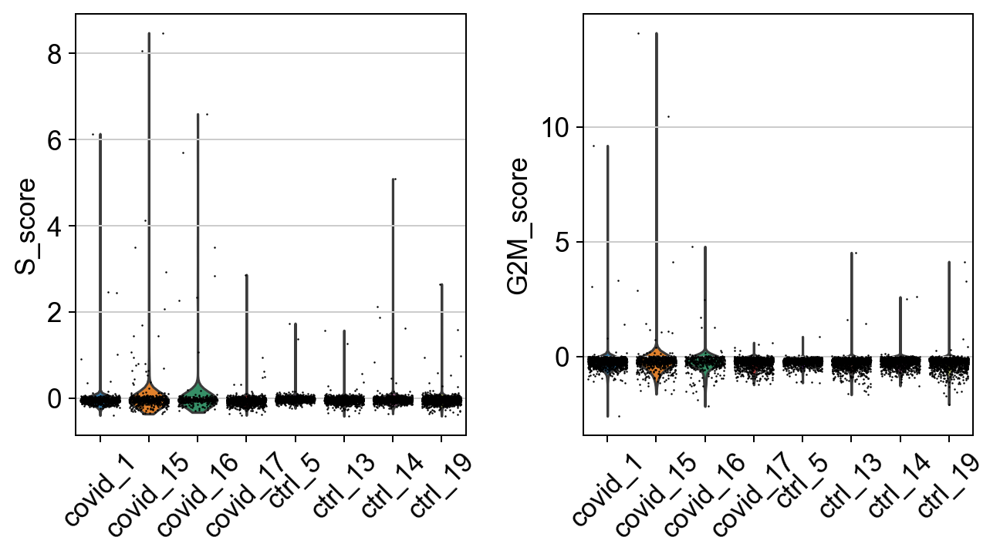

In [ ]:
sc.pl.violin(adata, ['S_score', 'G2M_score'], jitter=0.4, groupby = 'sample', rotation=45)

In this case it looks like we only have a few cycling cells in these datasets.

Scanpy does an automatic prediction of cell cycle phase with a default cutoff of the scores at zero. As you can see this does not fit this data very well, so be cautios with using these predictions. Instead we suggest that you look at the scores.

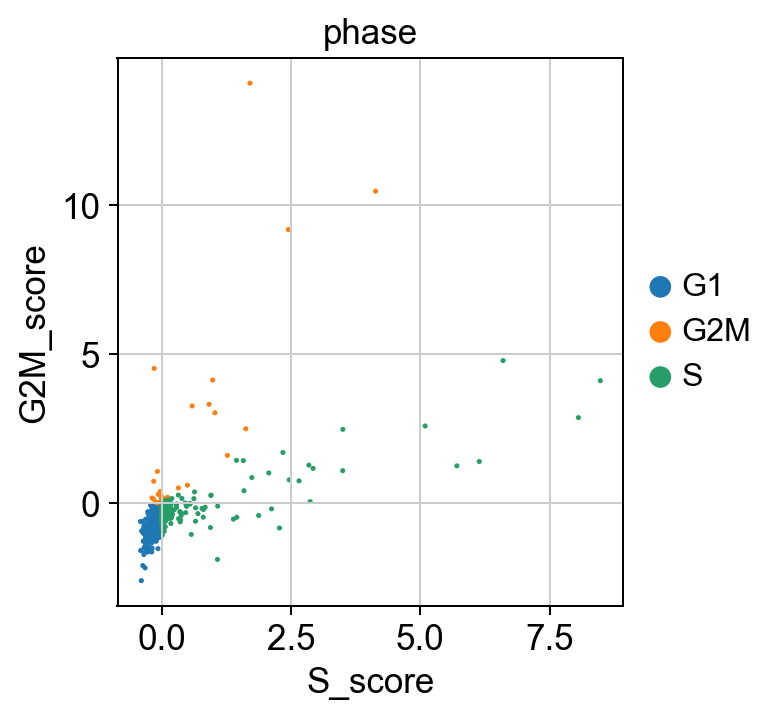

In [ ]:
sc.pl.scatter(adata, x='S_score', y='G2M_score', color="phase")

In [ ]:
adata.write_h5ad('data/covid/results/covid_filtered_removed_doublets_cell_cycle.h5ad')

## Feature selection
To reduce the feature dimension and redundancy as well as avoding overfitting in downstream analysis we perform feature selection. By this approach we focus on set of genes that can potentially explain biological variation in the dataset.  

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 2475


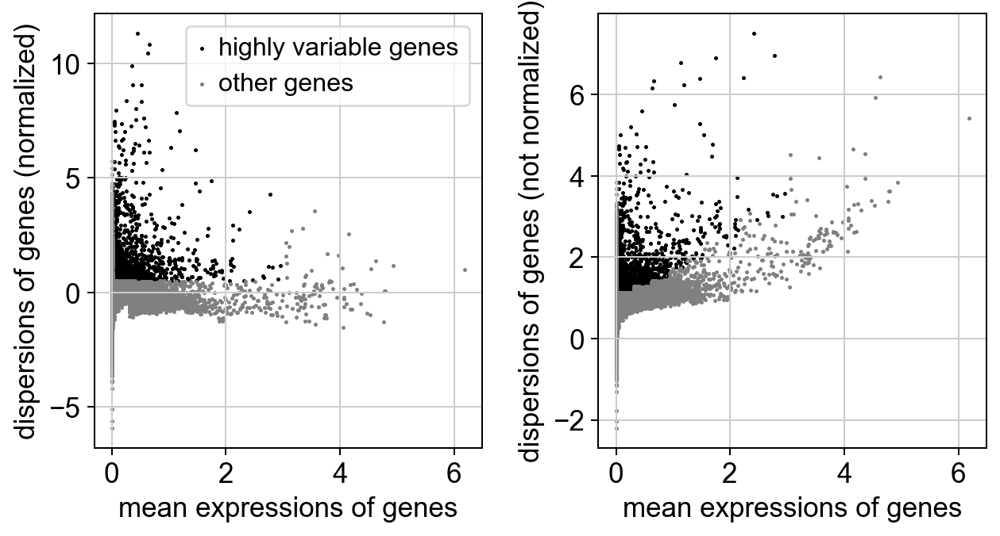

In [ ]:
# Load the data filtered data
adata = sc.read_h5ad(os.path.join(path_results, "covid_filtered.h5ad"))
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adata)

# store normalized counts in the raw slot, 
# we will subset adata.X for variable genes, but want to keep all genes matrix as well.
adata.raw = adata

# Identifying highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

print("Highly variable genes: %d"%sum(adata.var.highly_variable))

#plot variable genes
sc.pl.highly_variable_genes(adata)

# subset for variable genes in the dataset
adata = adata[:, adata.var['highly_variable']]

## Diomensionality reduction

After feature selection, we can still reduce the complexity (dimenstion) of the data using different algorithms:   
- PCA (Linear)  
- t-SNE & UMAP (non-linear)  

### PCA
To do this we first perform PCA and then plot the PCs (PC1 - PC7)  

computing PCA
    with n_comps=50
    finished (0:00:03)


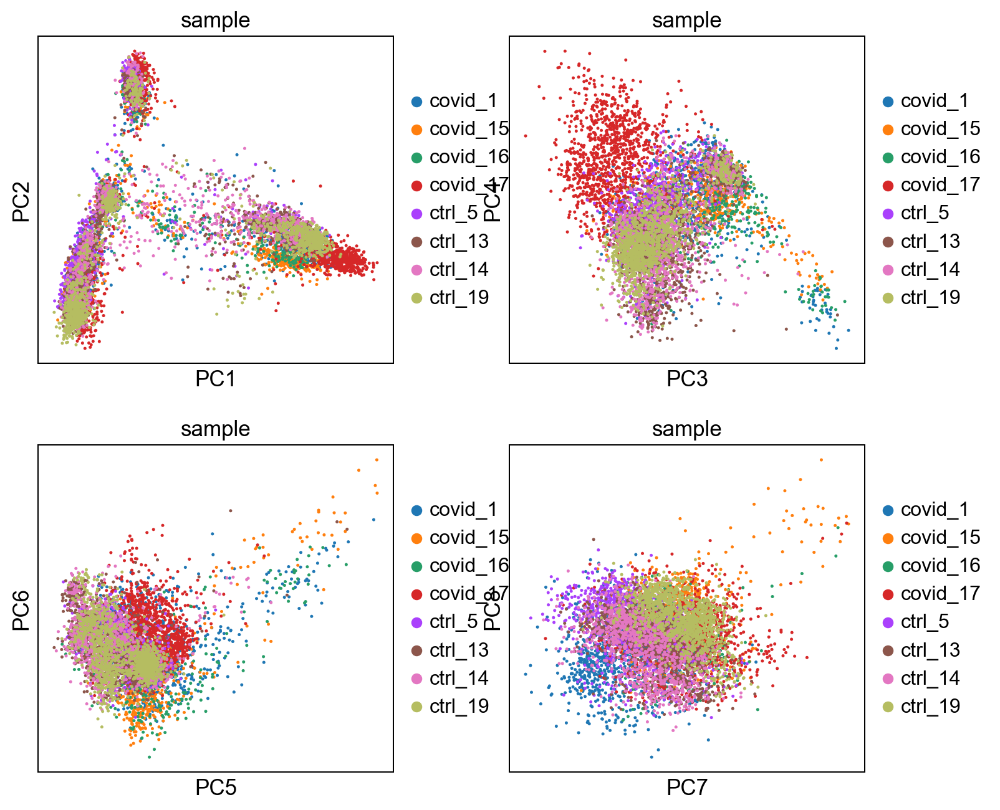

In [ ]:
# Calculating PCs
sc.tl.pca(adata, svd_solver='arpack')
# Visualising PCs
sc.pl.pca(adata, color='sample', components = ['1,2','3,4','5,6','7,8'], ncols=2)

You can also check which genes contributed to the capture variation in each PCs  

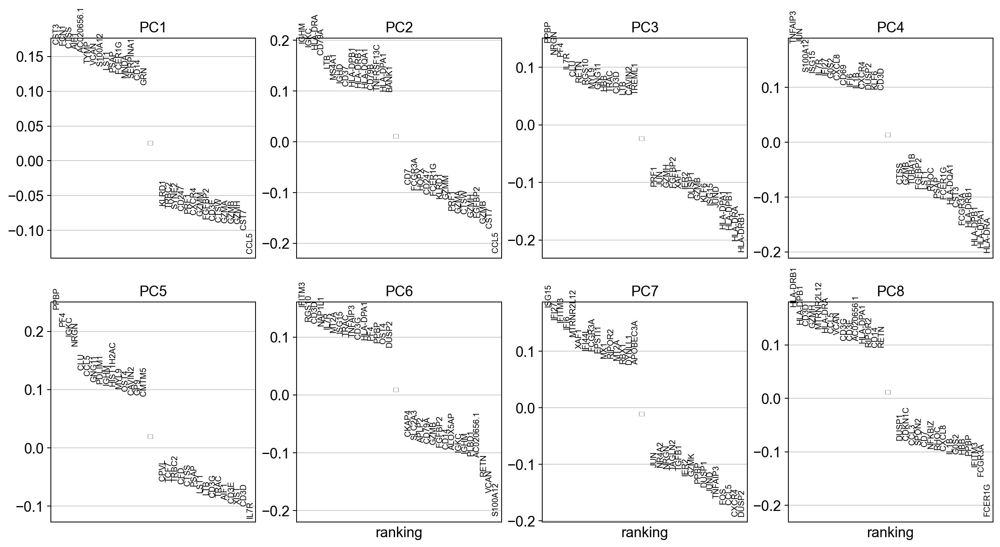

In [ ]:
sc.pl.pca_loadings(adata, components=[1,2,3,4,5,6,7,8])
# OBS! only plots the positive axes genes from each PC!!

Remember that not all the PCs can capture large fraction of the variance and can be discarded. By ranking the PCs we can identify elbow pattern and exclude them.

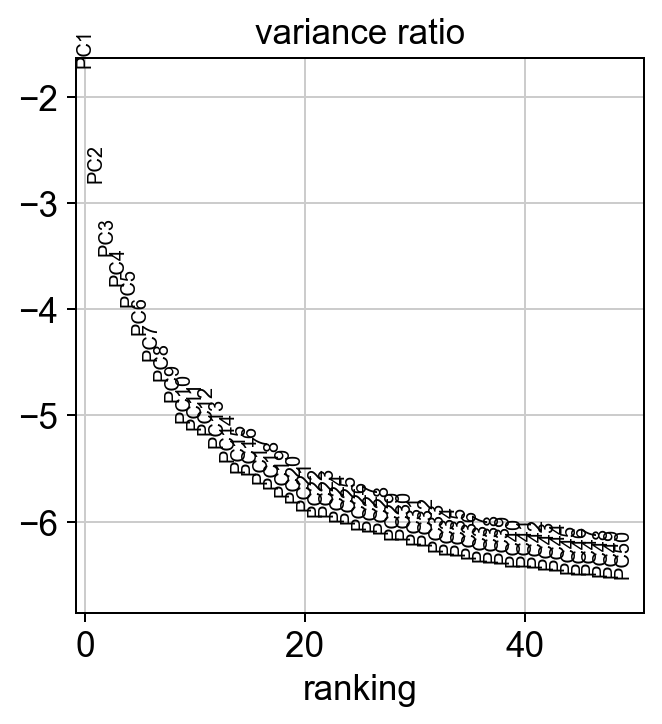

In [ ]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)

Top 21 PCs explain large fraction of variation or in other words retain a lot of information, while the rest of the PCs contain progressively less information. That said, it is still recommended to use more PCs since they can explain larger fraction of the variation and help to characterise rare cell types (e.g. platelets & DCs in this dataset). 

### t-SNE 

In [ ]:
sc.tl.tsne(adata, n_pcs = 30)

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:42)


We plot t-SNE scatterplot colored by sample IDs. As you can see there is a clear pattern of batch effect (there are not much overlap among samples while these samples should have some overlap indicating similar cell types). 

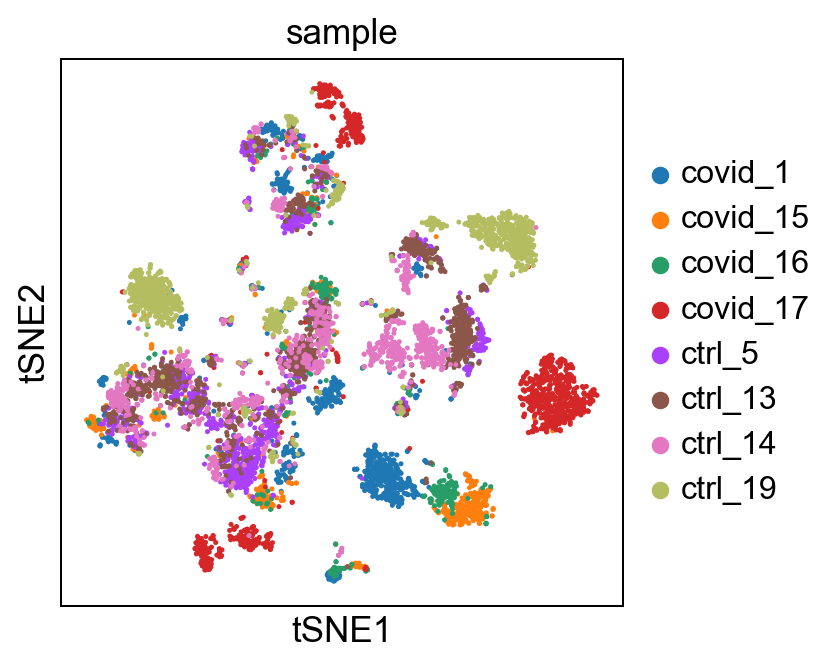

In [ ]:
sc.pl.tsne(adata, color=['sample'])

### UMAP

SCANPY uses a neighbourhood graph as the distance matrix, so we need to first calculate the graph.

In [ ]:
sc.pp.neighbors(adata, n_pcs=30, n_neighbors = 30)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


Now we run UMAP for all cell embeddings. 

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


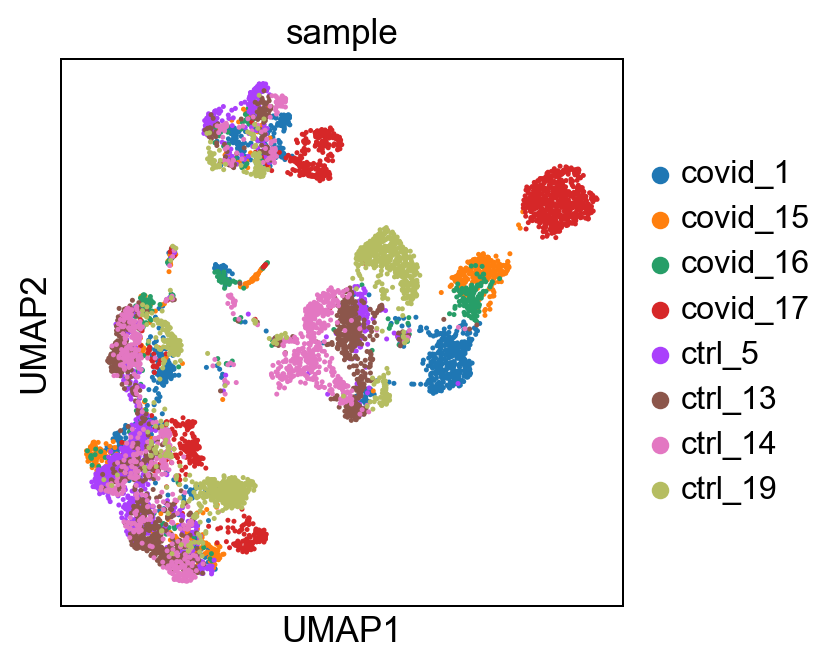

In [ ]:
sc.tl.umap(adata)
sc.pl.umap(adata, color = 'sample')

Here you can again see the batch effect.  
You can also select given number of components to calculate umap and also visualise neighbour edges, which shows the distance or connection among the cells dependent on their expression profile (?=??)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:22)


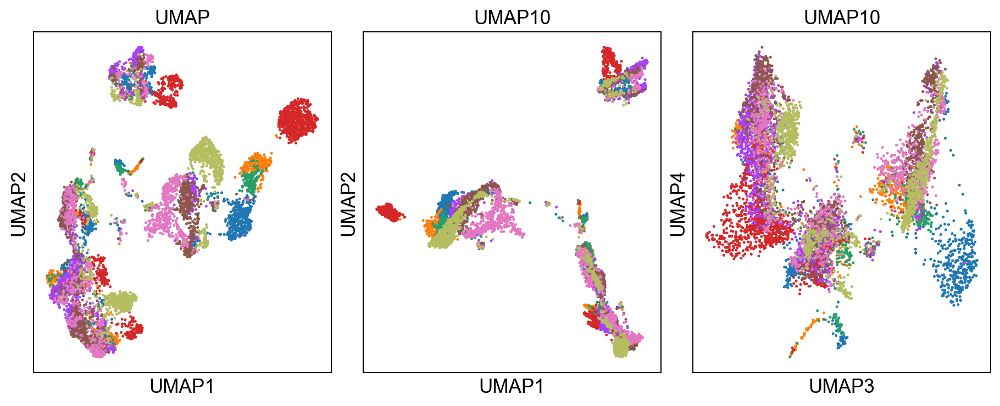

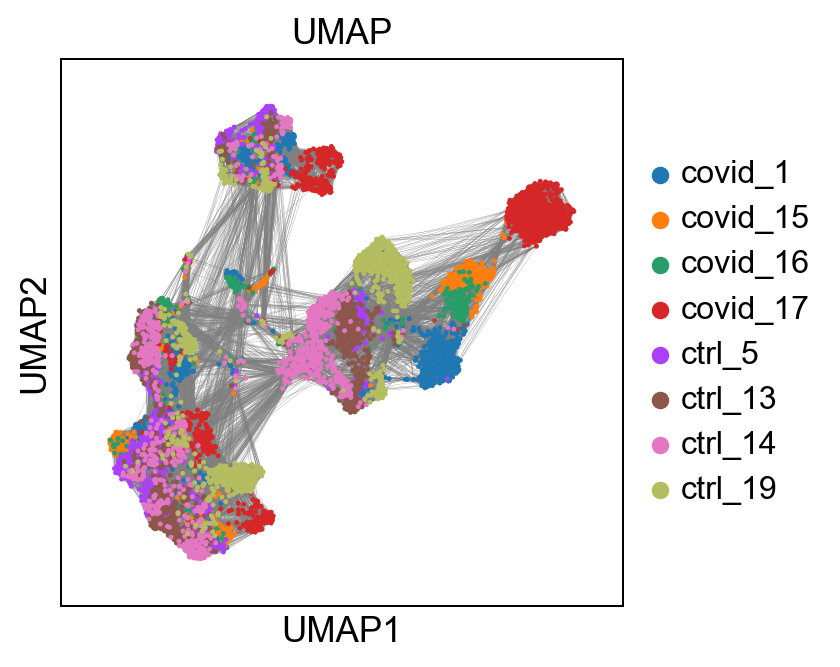

In [ ]:
# run with 10 components, save to a new object so that the umap with 2D is not overwritten.
umap10 = sc.tl.umap(adata, n_components=10, copy=True)
fig, axs = plt.subplots(1, 3, figsize=(10, 4), constrained_layout=True)

sc.pl.umap(adata, color='sample',  title="UMAP",
           show=False, ax=axs[0], legend_loc=None)
sc.pl.umap(umap10, color='sample', title="UMAP10", show=False,
           ax=axs[1], components=['1,2'], legend_loc=None)
sc.pl.umap(umap10, color='sample', title="UMAP10",
           show=False, ax=axs[2], components=['3,4'], legend_loc=None)

# we can also plot the umap with neighbor edges
sc.pl.umap(adata, color='sample', title="UMAP", edges=True)

Now let's compare different approaches for dimensionality reduction (PCA, t-SNE, and UMAP). 
Probably one of the main conclusion is presence of the batch effect and can have a strong impact on downstream analysis (differential gene expression).  
- What else?   
- Do you see any difference or similarity?   

<Axes: title={'center': 'sample'}, xlabel='UMAP1', ylabel='UMAP2'>

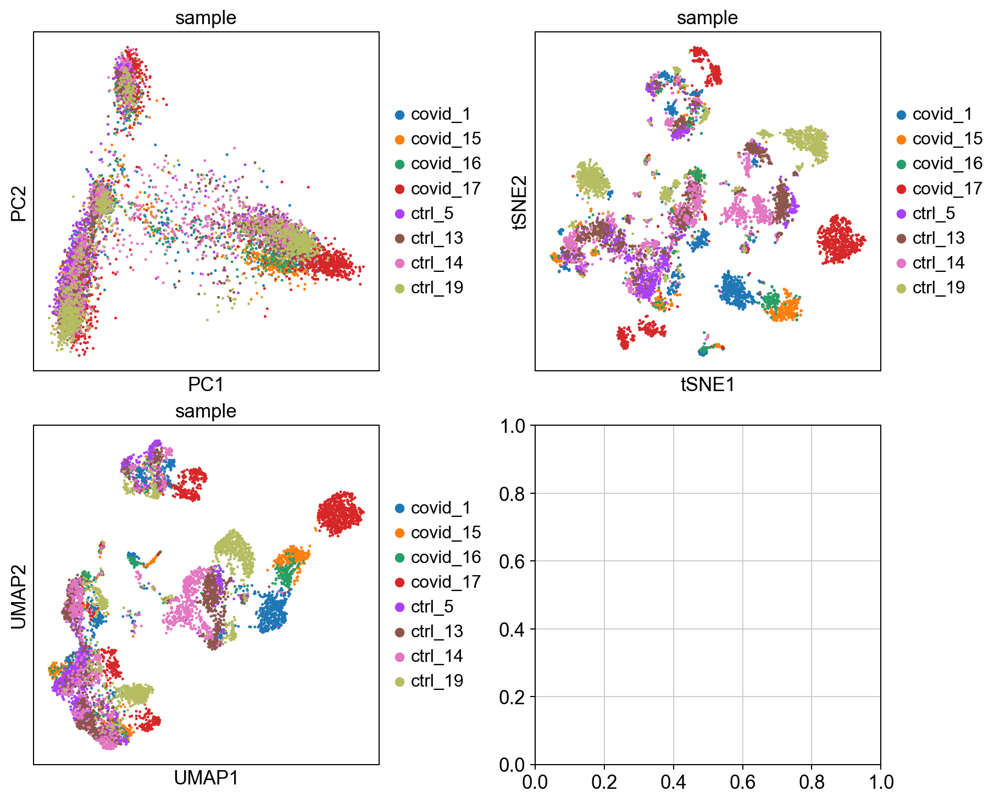

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), constrained_layout=True)
sc.pl.pca(adata, color='sample', components=['1,2'], ax=axs[0, 0], show=False)
sc.pl.tsne(adata, color='sample', components=['1,2'], ax=axs[0, 1], show=False)
sc.pl.umap(adata, color='sample', components=['1,2'], ax=axs[1, 0], show=False)

Now we can visulaise QC metrics in the generated UMAP.

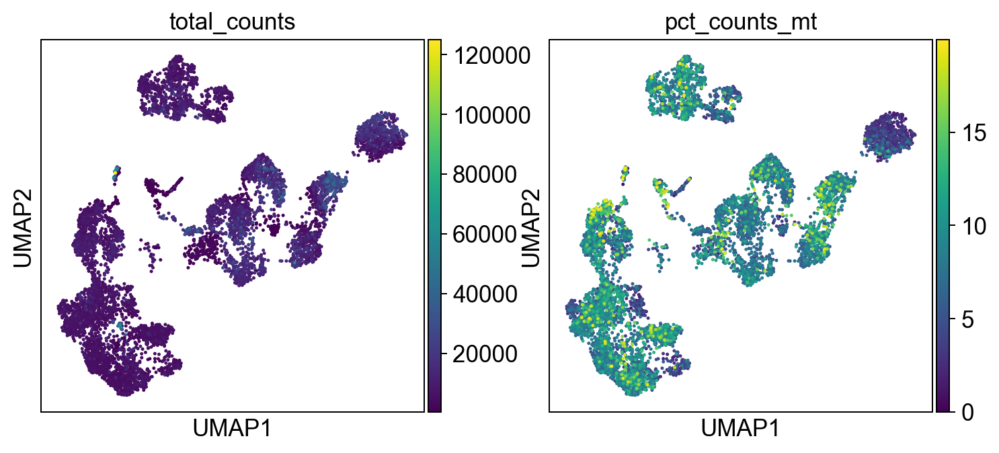

In [ ]:
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt"],
)

Or visualise genes of interest 

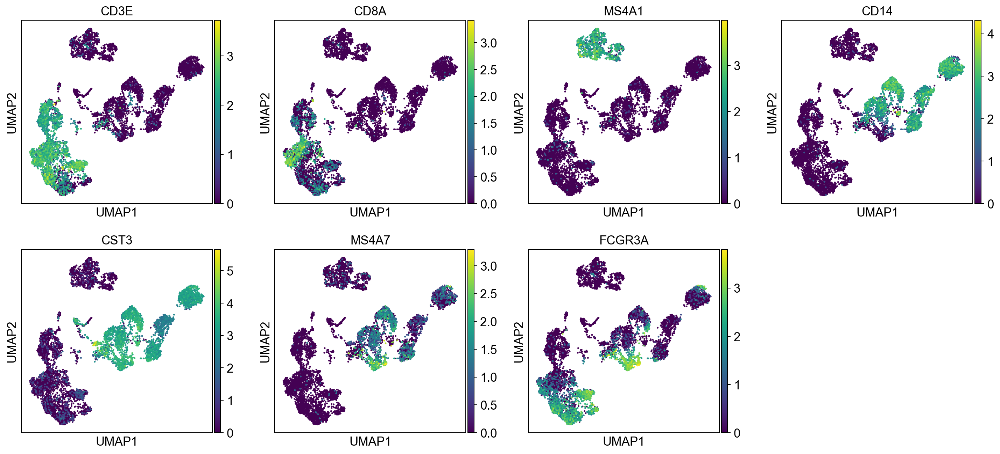

In [ ]:
sc.pl.umap(adata, 
           color=["CD3E", "CD8A", "MS4A1","CD14",
                  "CST3","MS4A7","FCGR3A"])

Saving the object.

In [ ]:
adata.write_h5ad('data/covid/results/covid_filtered_removed_doublets_dr.h5ad')

## Data Integration (Batch correction)

In [ ]:
adata2 = adata.raw.to_adata() 

# in some versions of Anndata there is an issue with information on the logtransformation in the slot log1p.base so we set it to None to not get errors.
adata2.uns['log1p']['base']=None

# check that the matrix looks like normalized counts
print(adata2.X[1:10,1:10])

  (0, 3)	0.7200956978688373
  (7, 6)	1.0486905983945876


### Detection of variable genes

In [ ]:
var_genes_all = adata.var.highly_variable

print("Highly variable genes: %d"%sum(var_genes_all))

Highly variable genes: 2475


Now, we extract variable genes in each sample using `batch_key` parameter.

In [ ]:
sc.pp.highly_variable_genes(adata2, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key = 'sample')

print("Highly variable genes intersection: %d"%sum(adata2.var.highly_variable_intersection))

print("Number of batches where gene is variable:")
print(adata2.var.highly_variable_nbatches.value_counts())

var_genes_batch = adata2.var.highly_variable_nbatches > 0

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes intersection: 124
Number of batches where gene is variable:
highly_variable_nbatches
0    8279
1    4027
2    3048
3    1937
4    1102
5     539
6     267
7     168
8     124
Name: count, dtype: int64


In [ ]:
print("Any batch var genes: %d"%sum(var_genes_batch))
print("All data var genes: %d"%sum(var_genes_all))
print("Overlap: %d"%sum(var_genes_batch & var_genes_all))
print("Variable genes in all batches: %d"%sum(adata2.var.highly_variable_nbatches == 6))
print("Overlap batch instersection and all: %d"%sum(var_genes_all & adata2.var.highly_variable_intersection))

Any batch var genes: 11212
All data var genes: 2475
Overlap: 2474
Variable genes in all batches: 267
Overlap batch instersection and all: 123


Select all genes that are variable in at least 2 datasets and use for remaining analysis.

In [ ]:
var_select = adata2.var.highly_variable_nbatches > 2
var_genes = var_select.index[var_select]
len(var_genes)

4137

### Harmony

We use `Harmony`  to integrate the data.  

In [ ]:
sce.pp.harmony_integrate(adata2, 'sample')

adata2.obsm['X_pca'] = adata2.obsm['X_pca_harmony']
sc.pp.neighbors(adata2, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata2)
sc.tl.leiden(adata2, resolution=0.5)

2024-09-02 09:45:54,454 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-09-02 09:45:58,009 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-09-02 09:45:58,103 - harmonypy - INFO - Iteration 1 of 10
2024-09-02 09:46:02,912 - harmonypy - INFO - Iteration 2 of 10
2024-09-02 09:46:06,195 - harmonypy - INFO - Iteration 3 of 10
2024-09-02 09:46:11,763 - harmonypy - INFO - Iteration 4 of 10
2024-09-02 09:46:15,063 - harmonypy - INFO - Iteration 5 of 10
2024-09-02 09:46:18,507 - harmonypy - INFO - Iteration 6 of 10
2024-09-02 09:46:20,947 - harmonypy - INFO - Converged after 6 iterations


computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


Now we  replot the UMAP after integration. You can see that the cells have been overlap.

<Axes: title={'center': 'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

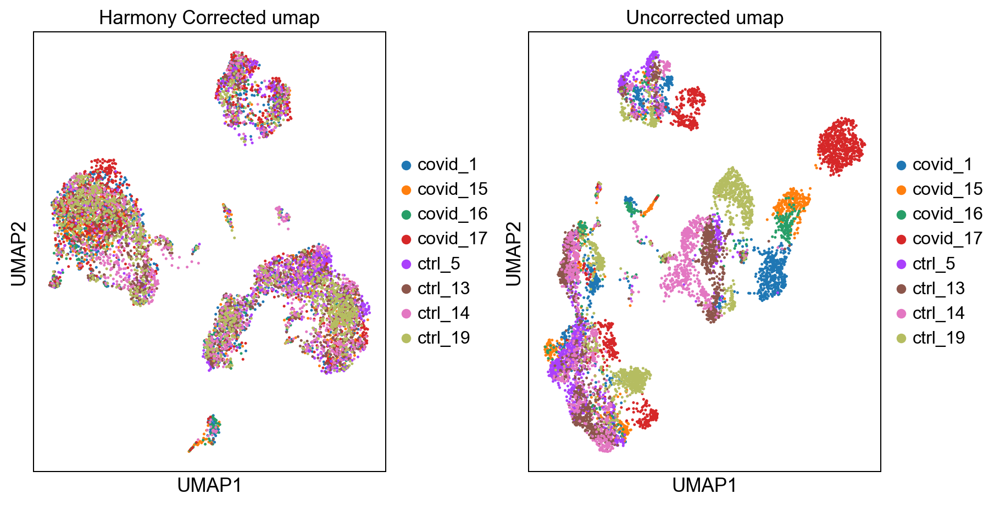

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10,5),constrained_layout=True)
sc.pl.umap(adata2, color="sample", title="Harmony Corrected umap", ax=axs[0], show=False)
sc.pl.umap(adata, color="sample", title="Uncorrected umap", ax=axs[1], show=False)

Let’s save the integrated data for further analysis.

In [ ]:
adata2.write_h5ad('data/covid/results/covid_filtered_removed_doublets_dr_harmony.h5ad')

### BBKNN

In [ ]:
adata_bbkn = adata.raw.to_adata() 

# in some versions of Anndata there is an issue with information on the logtransformation in the slot log1p.base so we set it to None to not get errors.
adata_bbkn.uns['log1p']['base']=None

bbknn.bbknn(adata_bbkn,batch_key='sample')

# then run umap on the integrated space
sc.tl.umap(adata_bbkn)
sc.tl.tsne(adata_bbkn)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:27)


Plots

<Axes: title={'center': 'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

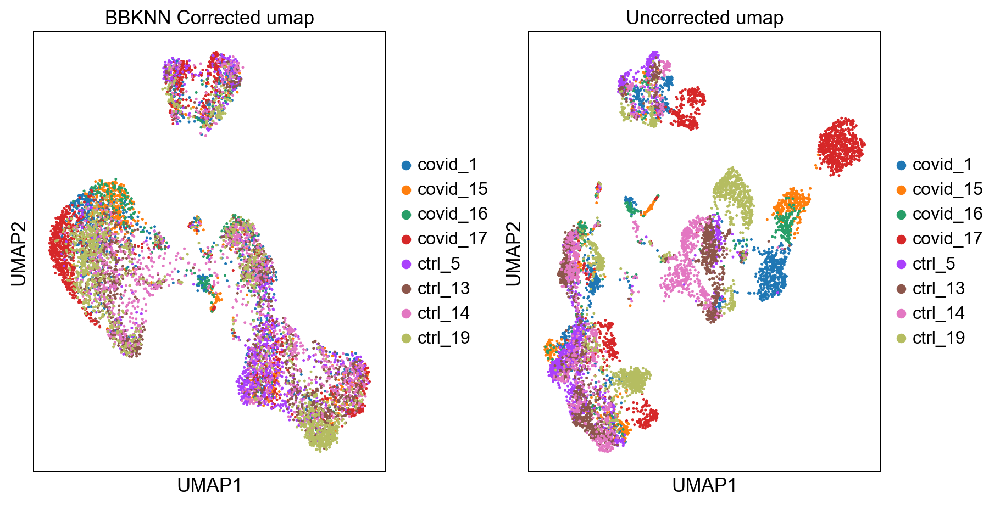

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10,5),constrained_layout=True)
sc.pl.umap(adata_bbkn, color="sample", title="BBKNN Corrected umap", ax=axs[0], show=False)
sc.pl.umap(adata, color="sample", title="Uncorrected umap", ax=axs[1], show=False)

Let’s save the integrated data for further analysis.

In [ ]:
adata2.write_h5ad('data/covid/results/covid_filtered_removed_doublets_dr_bbknn.h5ad')

### Combat
Batch correction can also be performed using `ComBat`, a method widely used for batch effect correction in both scRNASeq and bulk RNASeq data. It's important to note that `ComBat` requires the input data to be in a dense matrix format, which is already the case in this example.

In [ ]:
# create a new object with lognormalized counts
adata_combat = sc.AnnData(X=adata.raw.X, var=adata.raw.var, obs = adata.obs)

# first store the raw data 
adata_combat.raw = adata_combat

# run combat
sc.pp.combat(adata_combat, key='sample')

Standardizing Data across genes.

Found 8 batches

Found 0 numerical variables:
	

Found 35 genes with zero variance.
Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



To generate figures we require to rerun the standard steps as before:
- Vairable gene selection
- Calculating PCs
- t-SNE & UMAP

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 3749


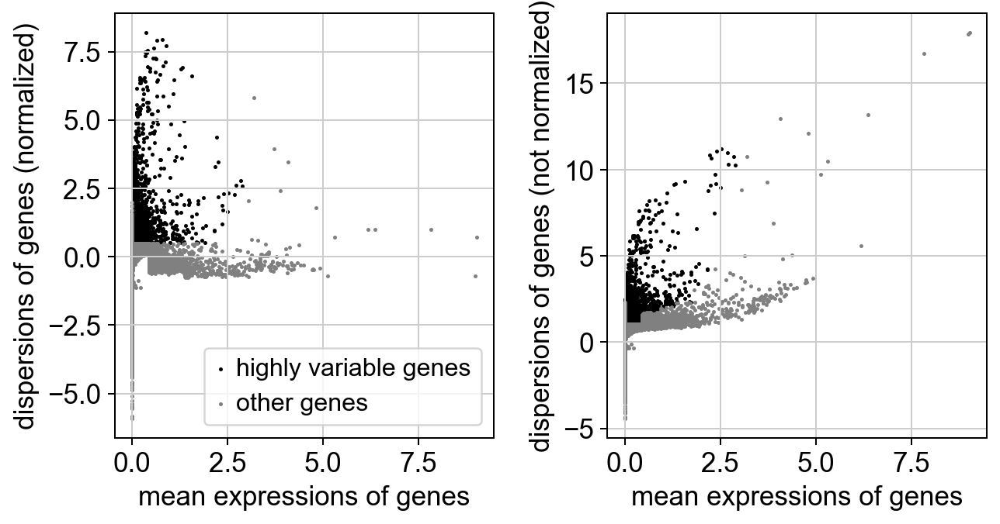

computing PCA
    with n_comps=30
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:28)


In [ ]:
sc.pp.highly_variable_genes(adata_combat)
print("Highly variable genes: %d"%sum(adata_combat.var.highly_variable))
sc.pl.highly_variable_genes(adata_combat)

sc.pp.pca(adata_combat, n_comps=30, use_highly_variable=True, svd_solver='arpack')

sc.pp.neighbors(adata_combat)

sc.tl.umap(adata_combat)
sc.tl.tsne(adata_combat)

We plot integrated and unintegrated data by using `ComBat`. 

<Axes: title={'center': 'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

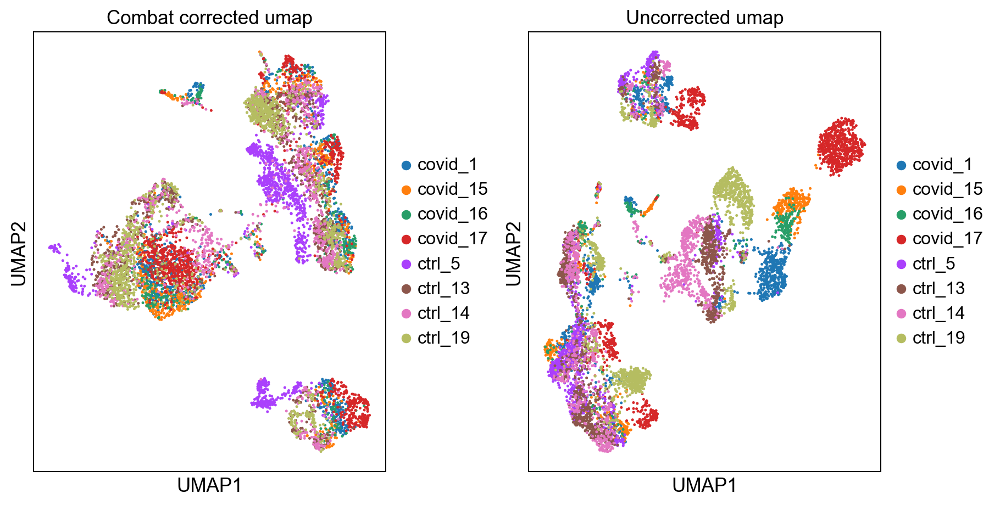

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10,5),constrained_layout=True)
sc.pl.umap(adata_combat, color="sample", title="Combat corrected umap", ax=axs[0], show=False)
sc.pl.umap(adata, color="sample", title="Uncorrected umap", ax=axs[1], show=False)

Let’s save the integrated data for further analysis.

In [ ]:
adata2.write_h5ad('data/covid/results/covid_filtered_removed_doublets_dr_combat.h5ad')

Now let's plot the output of all of the integration methods

<Axes: title={'center': 'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

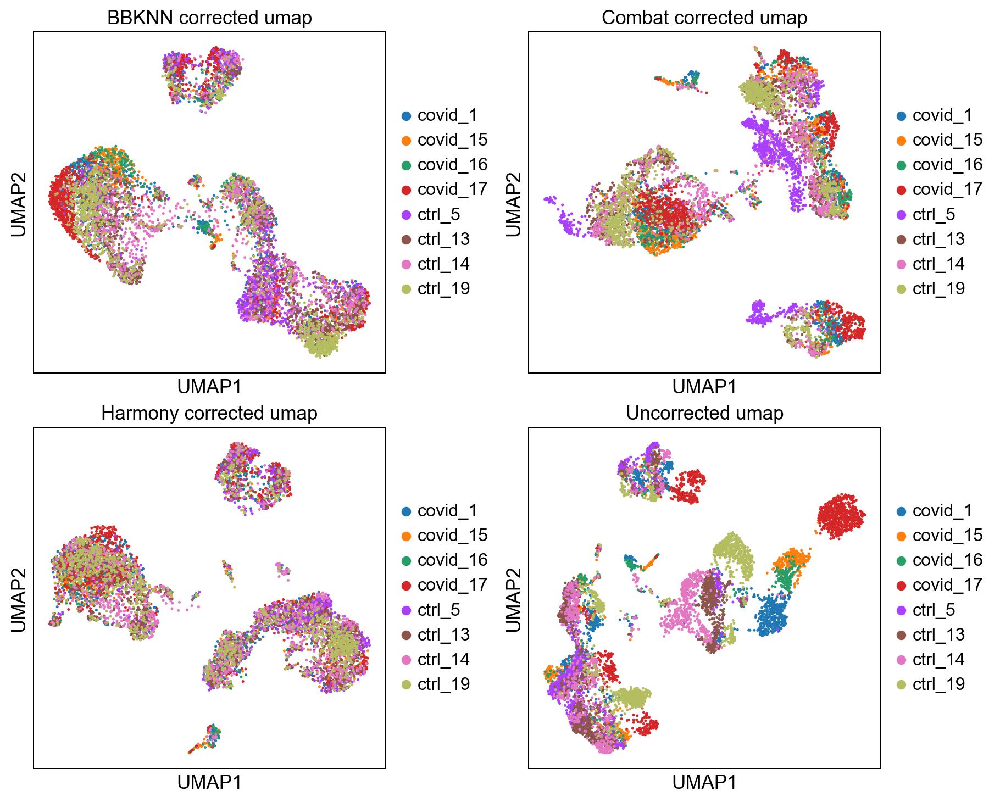

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(10,8),constrained_layout=True)
sc.pl.umap(adata_bbkn, color="sample", title="BBKNN corrected umap", ax=axs[0,0], show=False)
sc.pl.umap(adata_combat, color="sample", title="Combat corrected umap", ax=axs[0,1], show=False)
sc.pl.umap(adata2, color="sample", title="Harmony corrected umap", ax=axs[1,0], show=False)
sc.pl.umap(adata, color="sample", title="Uncorrected umap", ax=axs[1,1], show=False)

## Clustering 
Clustering is an unsupervised machine learning problem. We lable clusters by minimizing the intra-cluster distance in the reduced expression space. In this exercise, we use Leiden algorithm for clustering which is an improved version of Louvian algorithm (read more [here]()). 

There are different approaches in clustering:
- Graph-based: 
- K-means: 
- Hierarchical: 

**NOTE:** Louvian algorithm is no longer maintained. 

It is done in three steps:  
- Build a kNN graph from the data.  
- Prune spurious connections from kNN graph (optional step). This is a SNN graph.  
- Find groups of cells that maximizes the connections within the group compared other groups.  

If you recall from the integration, we already constructed a knn graph before running UMAP. Hence we do not need to do it again, and can run the community detection right away.

The modularity optimization algoritm in Scanpy are Leiden and Louvain. Lets test both and see how they compare.

**NOTE:** Please note that we will be working with `harmony` integration output

### Leiden


In [4]:
# Loading the anndata with integration by harmony
adata = sc.read_h5ad('data/covid/results/covid_filtered_removed_doublets_dr_harmony.h5ad')

In [11]:
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")

Plot the clusters: As you can observe, increasing the resolution results in finer granularity within the clustering, allowing for more detailed separation of cell groups. But you need to back it up by biological information you have. 

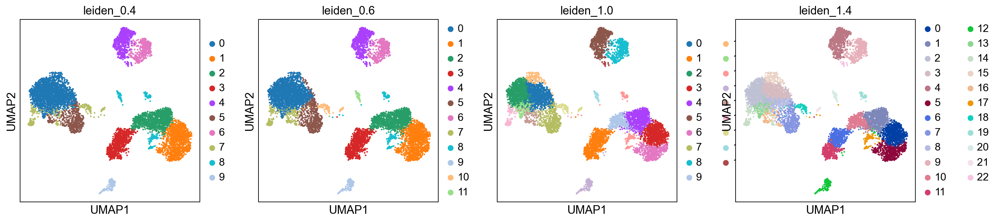

In [ ]:
sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.6', 'leiden_1.0','leiden_1.4'])

We can show the relationship between clusters by claculating correlation in PCA space. 

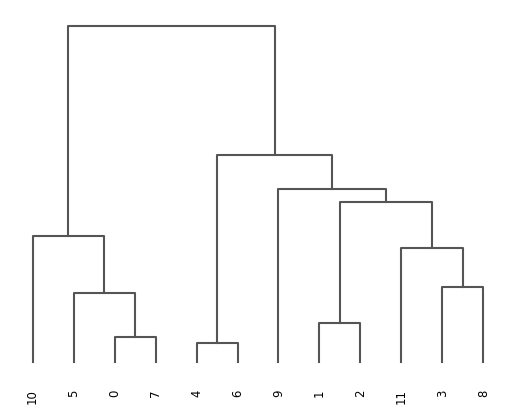

<AxesSubplot: >

In [14]:
sc.tl.dendrogram(adata, groupby = "leiden_0.6")
sc.pl.dendrogram(adata, groupby = "leiden_0.6")

Try to do the same for other resolutions.

As explained above using prior biological information about the system you are studying can come in hand to evaluate the clustering output. For example you can visualise expression of marker genes. Try to do that by using the same genes used in domensionality reduction step. 

/Users/nimra236/opt/anaconda3/envs/scRNAseq2023/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


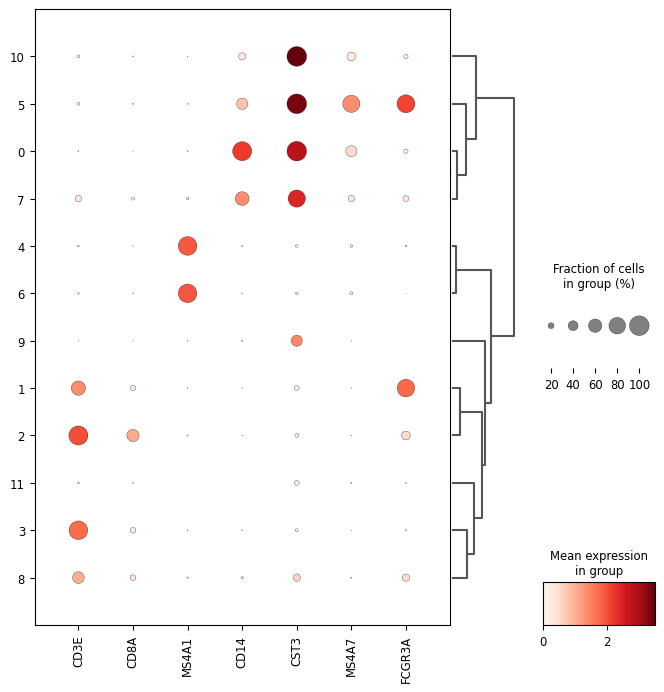

In [15]:
genes = ["CD3E", "CD8A", "MS4A1","CD14",
                  "CST3","MS4A7","FCGR3A"]
sc.pl.dotplot(adata, genes, groupby='leiden_0.6', dendrogram=True, figsize=(8, 8))

### K-means
In this approach, we first set the number of clusters. It is recommended to run K-means with multiple starting configurations.  

/Users/nimra236/opt/anaconda3/envs/scRNAseq2023/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/nimra236/opt/anaconda3/envs/scRNAseq2023/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/nimra236/opt/anaconda3/envs/scRNAseq2023/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/nimra236/opt/anaconda3/envs/scRNAseq2023/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'c

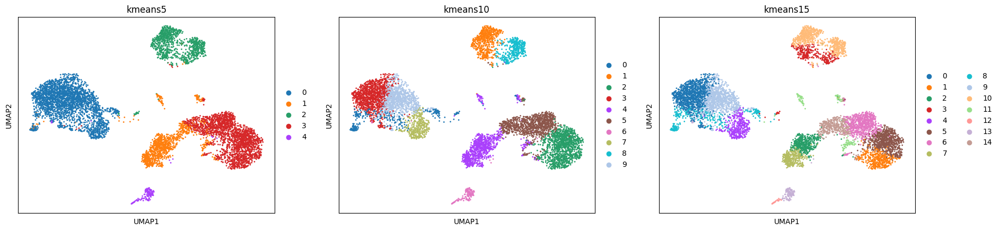

AxisArrays with keys: X_pca, X_pca_harmony, X_tsne, X_umap

In [23]:
# extract pca coordinates
X_pca = adata.obsm['X_pca_harmony'] 

# kmeans with k=5
kmeans = KMeans(n_clusters=5, random_state=0).fit(X_pca) 
adata.obs['kmeans5'] = kmeans.labels_.astype(str)

# kmeans with k=10
kmeans = KMeans(n_clusters=10, random_state=0).fit(X_pca) 
adata.obs['kmeans10'] = kmeans.labels_.astype(str)

# kmeans with k=15
kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca)
adata.obs['kmeans15'] = kmeans.labels_.astype(str)

sc.pl.umap(adata, color=['kmeans5', 'kmeans10', 'kmeans15'])

adata.obsm

### Hierarchical clustering
This method returns higherarchy of partitionings (a dendrogram) that can be cut at different levels in following steps:  
- Calculating distance between **samples** (cells in this case). This distance can be Euclidean distance or corrleation.    
- Defining a measure of distance between **clusters**.  (e.g. `linkage`, `single`, `average` , `median`, `centroid` and `ward`).  
- Defining the dendrogram among all samples using **Bottom-up** or **Top-down** approach. Bottom-up is where samples start with their own cluster which end up merged pair-by-pair until only one cluster is left. Top-down is where samples start all in the same cluster that end up being split by 2 until each sample has its own cluster.   


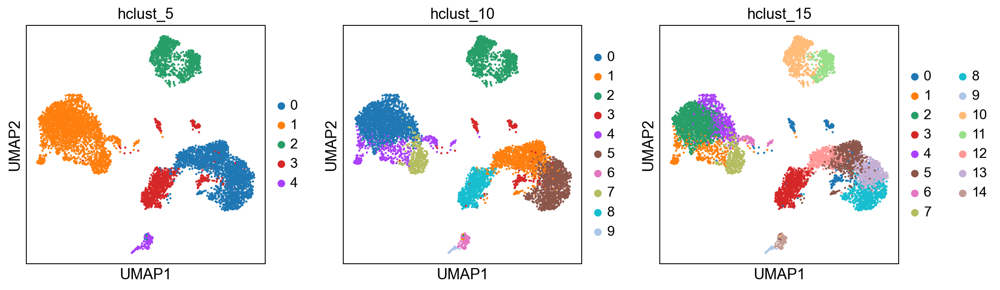

In [ ]:
cluster = AgglomerativeClustering(n_clusters=5, linkage='ward')
adata.obs['hclust_5'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=10, linkage='ward')
adata.obs['hclust_10'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=15, linkage='ward')
adata.obs['hclust_15'] = cluster.fit_predict(X_pca).astype(str)

sc.pl.umap(adata, color=['hclust_5', 'hclust_10', 'hclust_15'])

We now save the clustered data for further analysis.

In [ ]:
adata.write_h5ad('data/covid/results/covid_filtered_removed_doublets_dr_harmony_cl.h5ad')

Let's explor the distribution of samples in clusters.  

**Task:**   
- Select the clustering approach of interest (e.g. `leiden_0.6`) and plot proportion of Covid & Control groups in each cluster.  
- Also, show proportion of each sample in each cluster.  

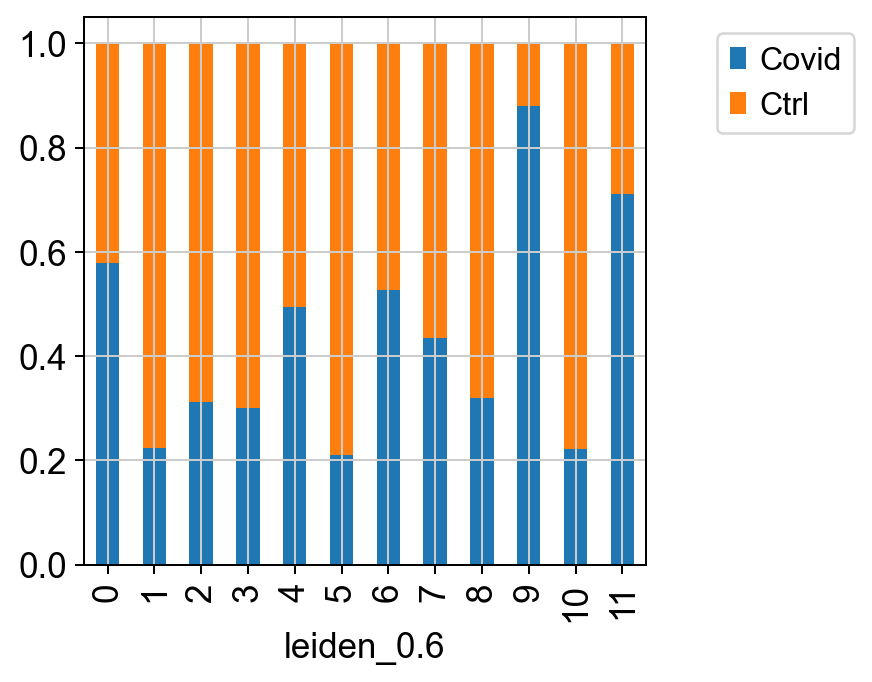

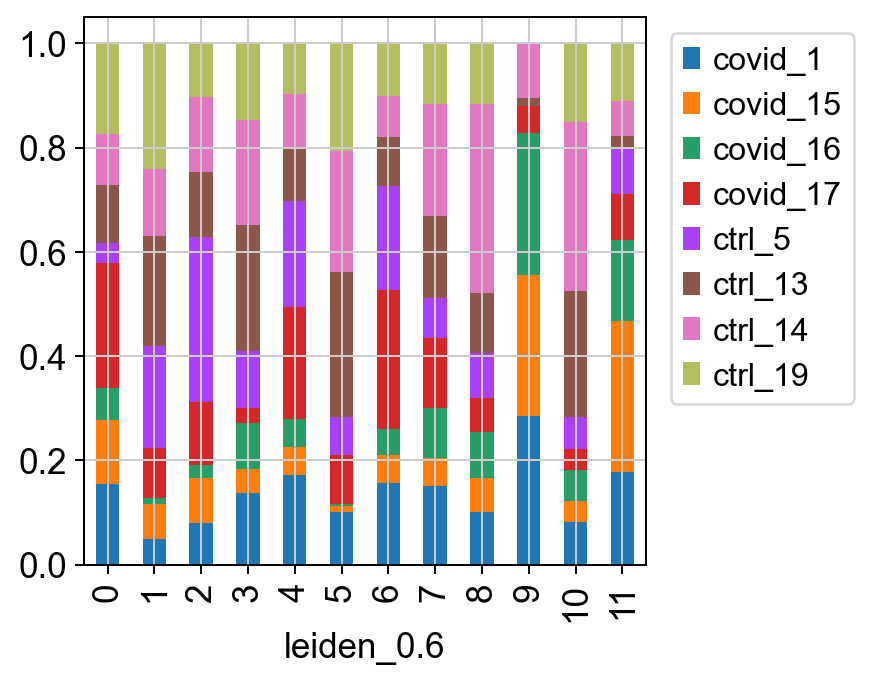

In [ ]:
tmp = pd.crosstab(adata.obs['leiden_0.6'],adata.obs['type'], normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.4, 1), loc='upper right')

tmp = pd.crosstab(adata.obs['leiden_0.6'],adata.obs['sample'], normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.4, 1),loc='upper right')

There is a good representation of each sample in given clusters. In a way we do not see a bias towards samples being present in only one cluster.  

**Task:**  
- Can you generate this plot in opposit direction? Showing the distribution of **clusters** in each **sample**. In other words, the colors show clusters while you have samples 
on x-axis.  
- Plot some of the QC metrics for each cluster (e.g. by violin plot)

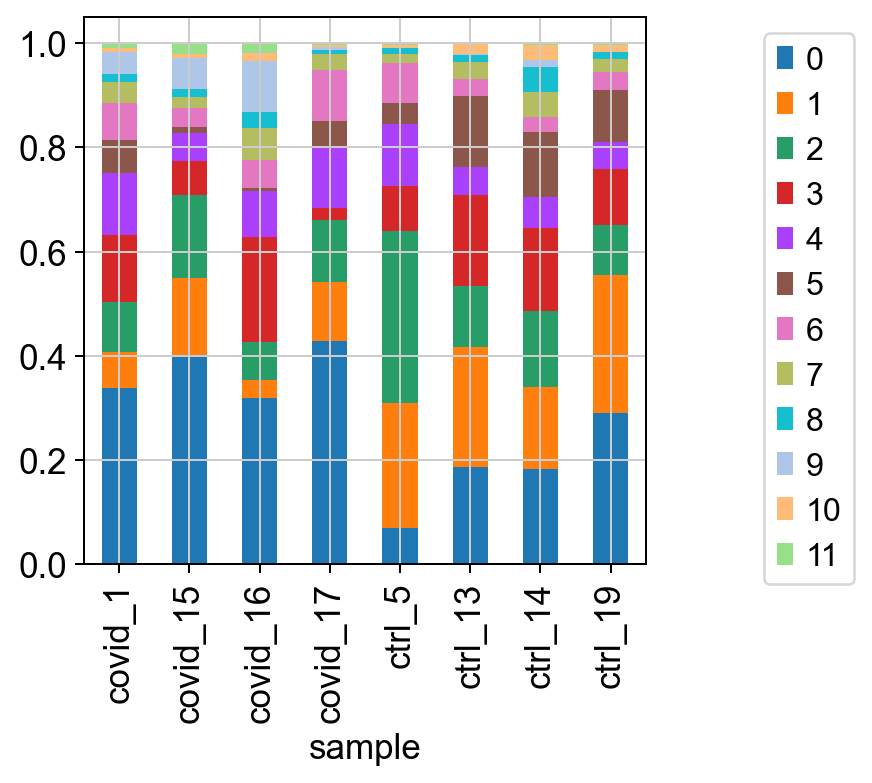

In [ ]:
tmp = pd.crosstab(adata.obs['sample'], adata.obs['leiden_0.6'], normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.4, 1), loc='upper right')


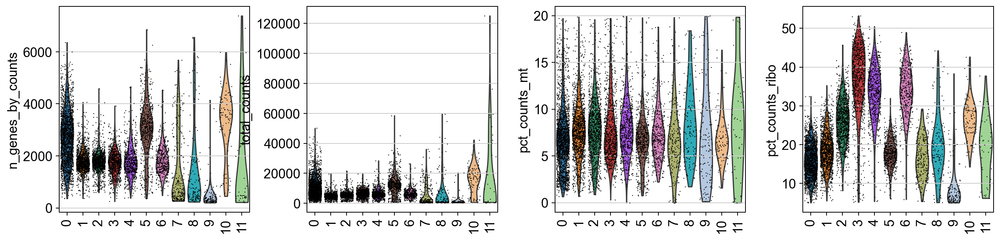

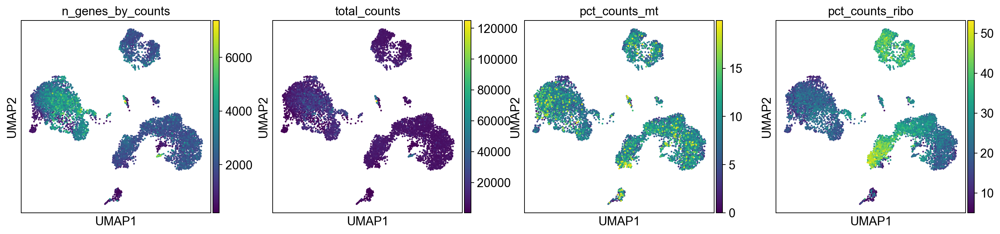

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, groupby = 'leiden_0.6', rotation= 90, multi_panel=False)

## Differential gene expression
Differential gene expression in scRNASeq data can be used to:  
- Identify gene markers to distinguish cell populations  
- Identify differentially regulated genes across conditions (healthy vs control)

There are parametric and non-parametric tests implemented in `rank_genes_group` (e.g. `logreg`, `t-test`, ` wilcoxon`).  

**NOTE:** By default, `.raw`  data in AnnData object used which can be controlled by `use_raw = False`.  



(7431, 19491)


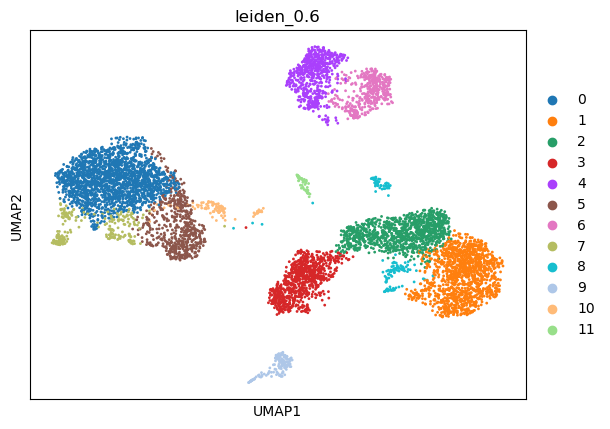

In [4]:
adata = sc.read_h5ad('data/covid/results/covid_filtered_removed_doublets_dr_harmony_cl.h5ad')

print(adata.X.shape)

sc.pl.umap(adata ,  color= 'leiden_0.6')

In the AnnData object we have all the genes after filtering (>19000 genes).

### T-test

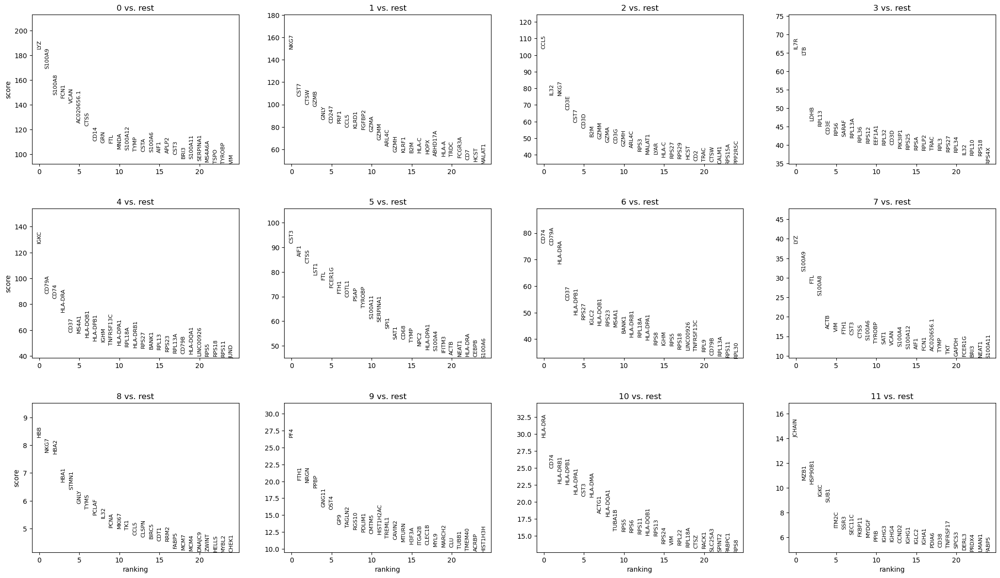

AnnData object with n_obs × n_vars = 7431 × 19491
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'percent_chrY', 'XIST-counts', 'n_counts', 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'kmeans5', 'kmeans10', 'kmeans15', 'hclust_5', 'hclust_10', 'hclust_15'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'dendrogram_leiden_0.6', 'hclust_10_colors', 'hclust_15_colors', 'hclust_5_colors', 'hvg', 'kmeans10_colors', 'kmeans15_colors', 'kmeans5_colors', 'leiden', 'leiden_0.4', 'leiden_0.4_colors', 'leiden_0.6', 'leiden_0.6_colors', 'leiden_1.0', 'leiden_1.0_colors', 'leiden_1.4', 'leiden_1.

In [5]:
sc.tl.rank_genes_groups(adata, 'leiden_0.6', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "t-test")

# results are stored in the adata.uns["t-test"] slot
adata

### Wilcoxon rank-sum

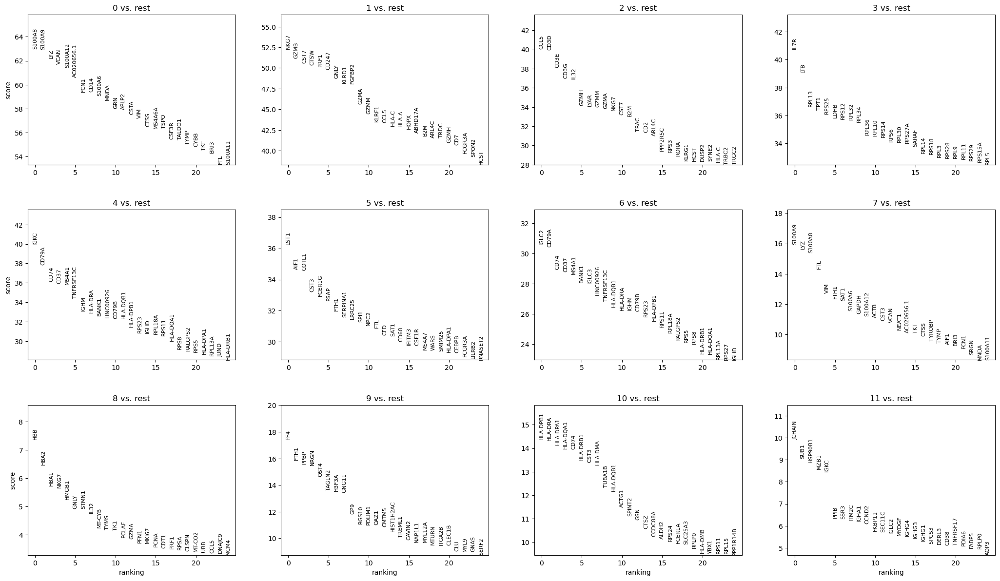

In [6]:
sc.tl.rank_genes_groups(adata, 'leiden_0.6', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

### Comparing the output of DEG analysis
Here we check the overlap of DEGs among different appraoches

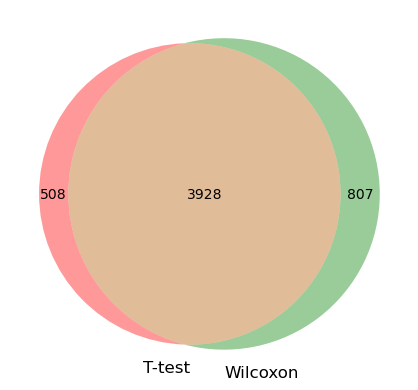

In [8]:
#compare cluster1 genes, only stores top 100 by default

tt = sc.get.rank_genes_groups_df(adata, group='0', key='t-test', pval_cutoff=0.01, log2fc_min=0)['names']
wc = sc.get.rank_genes_groups_df(adata, group='0', key='wilcoxon', pval_cutoff=0.01, log2fc_min=0)['names']

venn2([set(wc),set(tt)], ('T-test','Wilcoxon') )
plt.show()

### Visualisation  
We can show DEGs by different approaches.

For example here we select top 5 genes and visualise their expression per cluster.

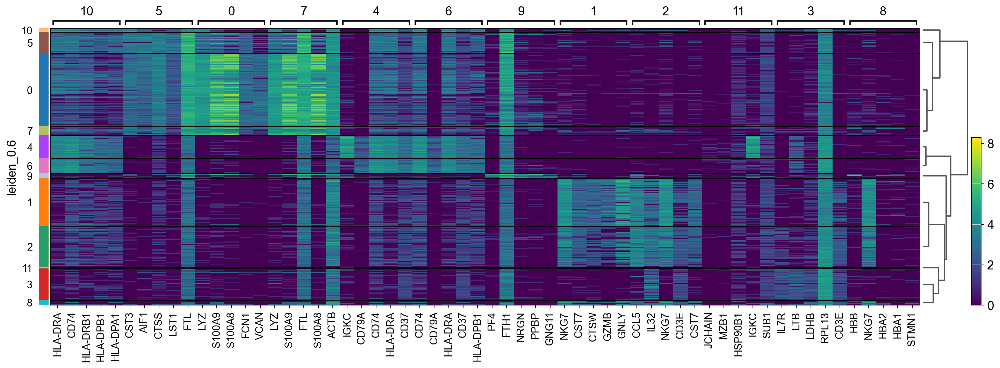

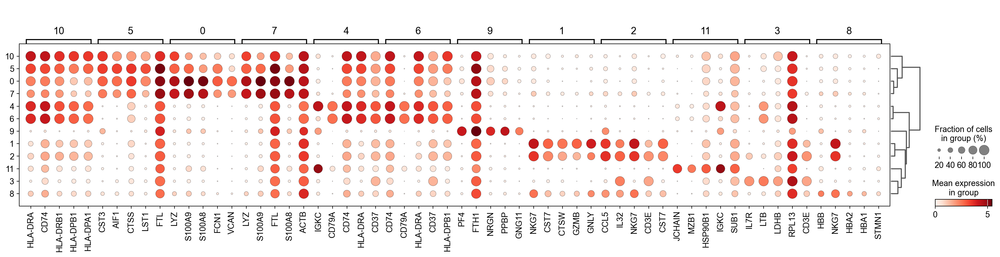

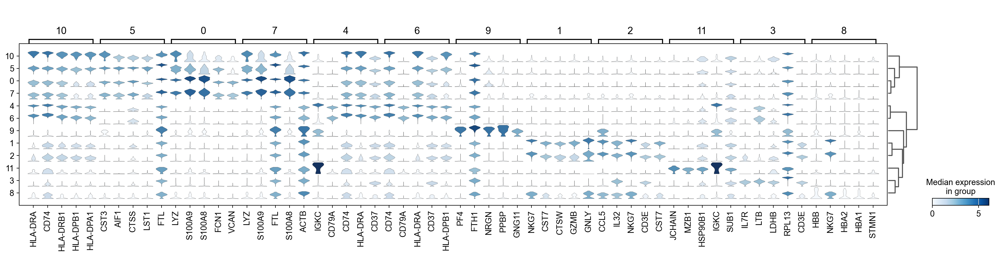

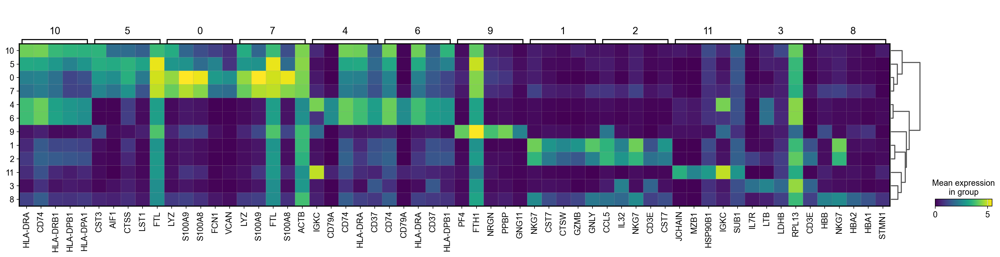

In [ ]:
# Heatmap
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="t-test", groupby="leiden_0.6", show_gene_labels=True)
# dotplot 
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, key="t-test", groupby="leiden_0.6")
# violin plot
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="t-test", groupby="leiden_0.6")
# matrixplot
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="t-test", groupby="leiden_0.6")

### Coparison between conditions (Covid vs Control)
In addition to differential expression analysis among clusters, we can make a comparison between conditions within clusters. To do so, we need to subset our data for the desired cell cluster, then change the cell identities to the variable of comparison (e.g. Covid/Ctrl).

type
Ctrl     311
Covid    303
Name: count, dtype: int64


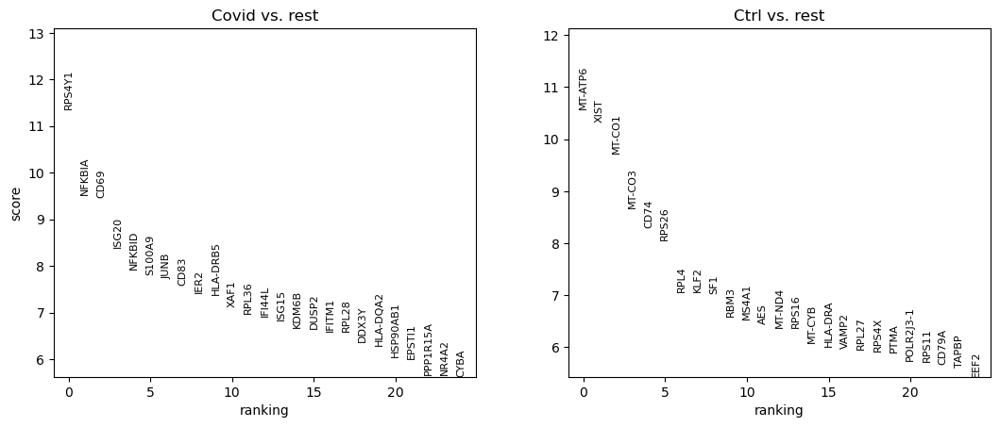

In [11]:
cl1 = adata[adata.obs['leiden_0.6'] == '4',:]
print(cl1.obs['type'].value_counts())


sc.tl.rank_genes_groups(cl1, 'type', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(cl1, n_genes=25, sharey=False, key="wilcoxon")


We can also show the expression distribution of significant genes. 

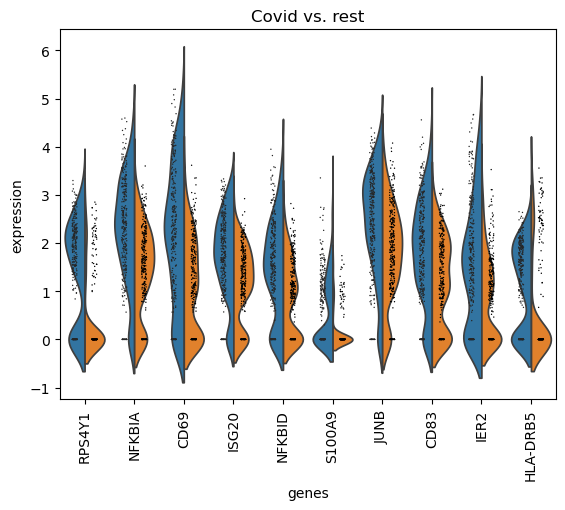

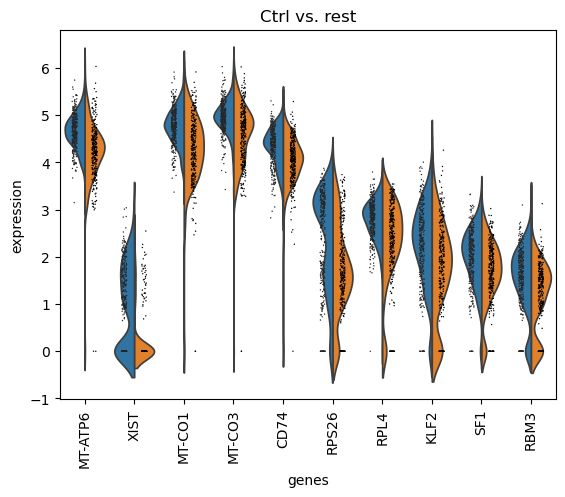

In [12]:
sc.pl.rank_genes_groups_violin(cl1, n_genes=10, key="wilcoxon")

IT is also possible to show the expression distribution of selected genes in each cluster for both conditions (Covid//Control)

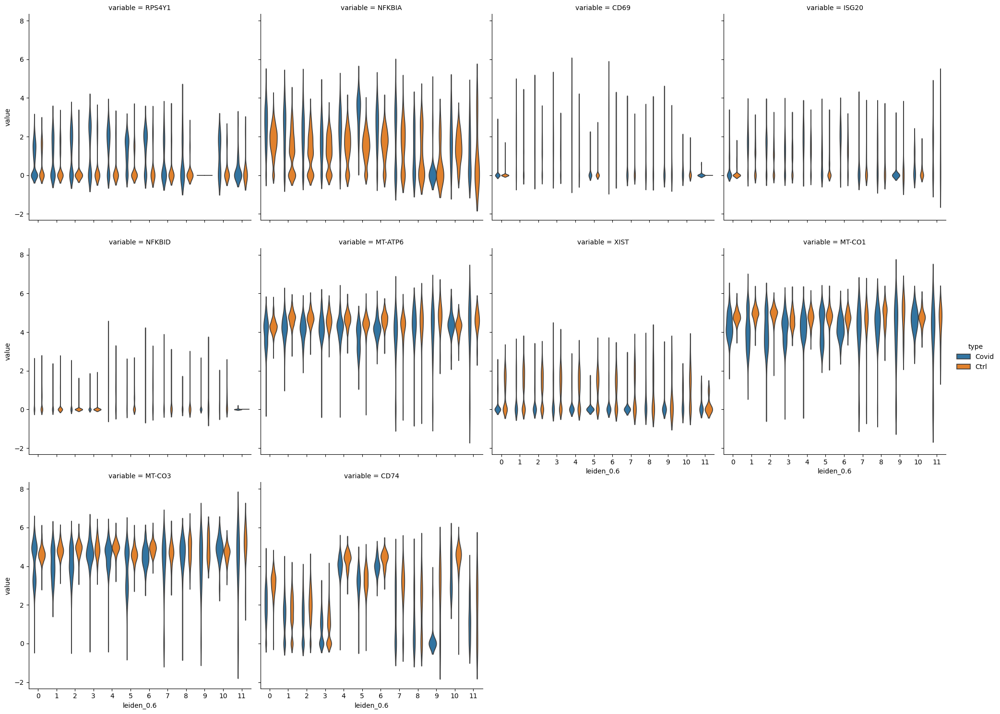

In [14]:
genes1 = sc.get.rank_genes_groups_df(cl1, group='Covid', key='wilcoxon')['names'][:5]
genes2 = sc.get.rank_genes_groups_df(cl1, group='Ctrl', key='wilcoxon')['names'][:5]
genes = genes1.tolist() +  genes2.tolist() 
df = sc.get.obs_df(adata, genes + ['leiden_0.6','type'], use_raw=False)
df2 = df.melt(id_vars=["leiden_0.6",'type'], value_vars=genes)

sns.catplot(x = "leiden_0.6", y = "value", hue = "type", kind = 'violin', col = "variable", data = df2, col_wrap=4, inner=None)

Some of the identified genes are located on sex chromosome, which is due to imbalanced sex ratio in the dataset and we can remove the genes from sex chromosome and redo the analysis. 

550
19491
18941


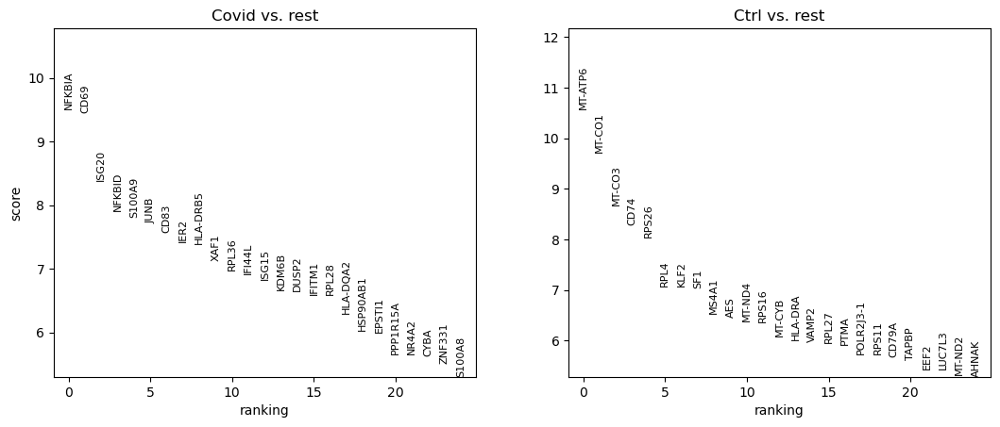

In [15]:
# Removing sex chromosome genes 
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrX_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "X"])

sex_genes = chrY_genes.union(chrX_genes)
print(len(sex_genes))
all_genes = cl1.var.index.tolist()
print(len(all_genes))

keep_genes = [x for x in all_genes if x not in sex_genes]
print(len(keep_genes))

cl1 = cl1[:,keep_genes]

# run the rank_genes_groups again
sc.tl.rank_genes_groups(cl1, 'type', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(cl1, n_genes=25, sharey=False, key="wilcoxon")

### Subsample
It is important that samples show consistent pattern of expression in significant genes. Let's look in our dataset how consistent is the expression profile of identified genes.

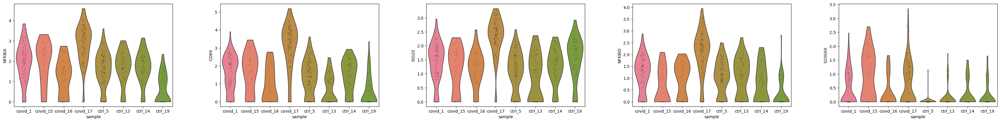

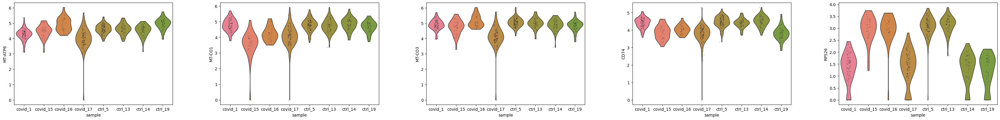

In [18]:
genes1 = sc.get.rank_genes_groups_df(cl1, group='Covid', key='wilcoxon')['names'][:5]
genes2 = sc.get.rank_genes_groups_df(cl1, group='Ctrl', key='wilcoxon')['names'][:5]

sc.pl.violin(cl1, genes1, groupby='sample')
sc.pl.violin(cl1, genes2, groupby='sample')

We can also visualise as dotplot by which we can screen more genes (e.g. 20). 

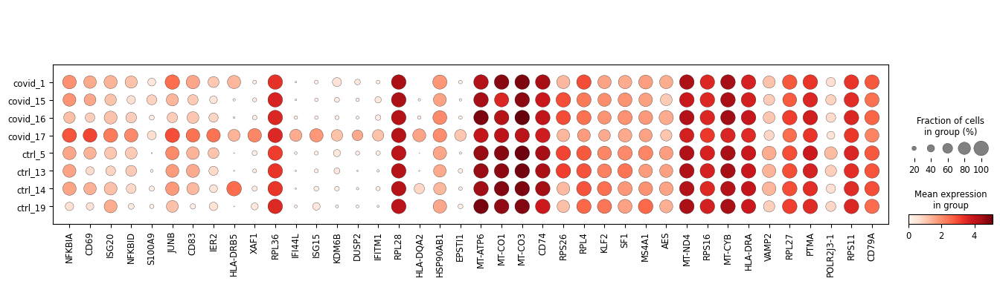

In [20]:
genes1 = sc.get.rank_genes_groups_df(cl1, group='Covid', key='wilcoxon')['names'][:20]
genes2 = sc.get.rank_genes_groups_df(cl1, group='Ctrl', key='wilcoxon')['names'][:20]
genes = genes1.tolist() +  genes2.tolist() 

sc.pl.dotplot(cl1, genes, groupby='sample')

As you can see, sample **Covid_17** has a distinct expression profile and has the highest number of cells which may drive the signal. 

In [21]:
cl1.obs['sample'].value_counts()

sample
covid_17    131
ctrl_5      125
covid_1     106
ctrl_13      63
ctrl_14      63
ctrl_19      60
covid_15     33
covid_16     33
Name: count, dtype: int64

In order to control for the bias, we subsample to have the same number of cells for comparison. 

In [22]:
target_cells = 37

# Split the data by 'sample'
tmp = [cl1[cl1.obs['sample'] == s].copy() for s in cl1.obs['sample'].cat.categories]

# Subsample each group if it has more than target_cells
for dat in tmp:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells)

# Concatenate the subsampled data
cl1_sub = tmp[0].concatenate(*tmp[1:], batch_key=None)

# Display value counts of the 'sample' column
cl1_sub.obs['sample'].value_counts()


sample
covid_1     37
covid_17    37
ctrl_5      37
ctrl_13     37
ctrl_14     37
ctrl_19     37
covid_15    33
covid_16    33
Name: count, dtype: int64

Now, we repeat the comparison and visualise DEGs.

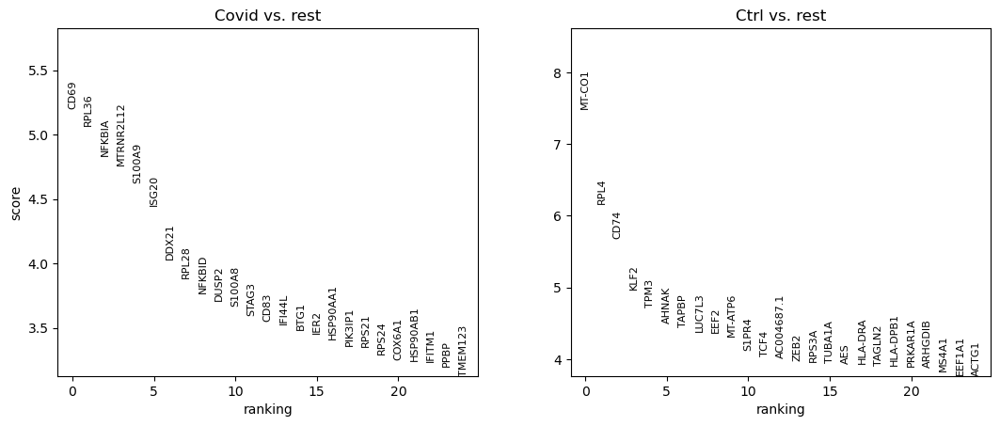

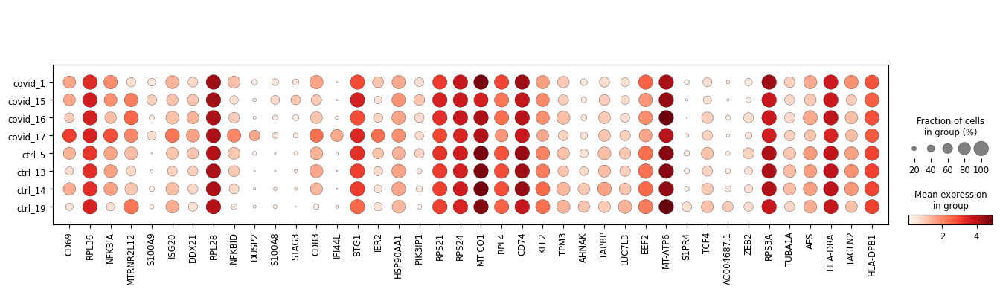

In [24]:
sc.tl.rank_genes_groups(cl1_sub, 'type', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(cl1_sub, n_genes=25, sharey=False, key="wilcoxon")

genes1 = sc.get.rank_genes_groups_df(cl1_sub, group='Covid', key='wilcoxon')['names'][:20]
genes2 = sc.get.rank_genes_groups_df(cl1_sub, group='Ctrl', key='wilcoxon')['names'][:20]
genes = genes1.tolist() +  genes2.tolist() 

sc.pl.dotplot(cl1,genes, groupby='sample')

The results are much improved now. However, when examining the data per patient, we still see some genes predominantly influenced by a single patient. It's generally a good practice to control for the number of cells from each sample when performing differential expression analysis.

There are several methods available to address patient batch effects, but many of them rely on R packages. These can be accessed through rpy2, as demonstrated in this compendium: https://www.sc-best-practices.org/conditions/differential_gene_expression.html.

Currently, we haven't included this approach. Instead, refer to the patient batch effect section in the Seurat DGE tutorial, where we demonstrate running EdgeR on pseudobulk and MAST with random effects.